## **Project Submission** - Item Demand Forecasting - **S Varun Athithiya** - D14 A

## **Problem Statement** 

* Demand forecasts are fundamental to plan and deliver products
and services. 
* Accurate forecasting of demand can help the manufacturers to maintain appropriate stock which results in reduction in loss due to product not being sold and also reduces the opportunity cost (i.e. higher demand but less
availability => opportunity lost). 
* Despite such relevance, manufacturers have difficulty choosing which forecast model is the best for their use case. 
* In this project, historical sales data corresponding to 50 items sold in 10 stores are provided and participants are expected to come up with a best model to predict the future demand for products which results in maximum profit for the manufacturer. 
* **In general, the manufacturer incurs a loss of Rs. 10 for each item that is not sold (retention cost) and incurs an opportunity loss of Rs. 3 for excess demand.**
* Predict the demand for the next 3 months at the item level (i.e. all the stores combined).

#### **Time Series Forecasting Pipeline**
---

> Data Importing  >>  Data Wrangling  >>  EDA (decomposition, rolling stats, distribution plots)  >>  Stationarity Check  >>  Prediction  >>  Tuning

#### **What is a time series?** 
---

* A set of observations that are recorded  at fixed intervals of time


* **Applications**
> * Helps to forecast the business opportunity in the future by analyzing the past data.
> * Helps to evaluate the current accomplishment.

#### **Components of time series**
---


* **Trend**
> * if magnitude increases with time - upward trend
> * if magnitude decreases with time - downward trend
> * if magnitude remains constant - horizontal trend

* **Seasonality** - repeating ups and downs after a fixed time
* **Irregularity** - no systematic pattern, occurs for a short time, does not repeat itself after a fixed time. Also called residual or noise.
* **Cycles** - patterns that occur over several years time
* **Additive & Multiplicative Time Series**
> * If the amplitude increases with time, it is multiplicative series. A multiplicative timeseries can be converted into additive series by applying log transformation.
> * If the amplitude is constant with time - it is additive series.

#### **Stationarity**
---

* Constant mean
* Constant standard deviation
* Absence of **seasonality** i.e. *periodic behaviour over time*

**Let us understand the different types of stationarities and how to interpret the results of the above tests.**

> * **Strict Stationary:** the mean, variance and covariance are not the function of time. The aim is to convert a non-stationary series into a strict stationary series for making predictions.
> * **Trend Stationary:** A series that has no unit root but exhibits a trend is referred to as a trend stationary series. Once the trend is removed, the resulting series will be strict stationary. The KPSS test classifies a series as stationary on the absence of unit root. This means that the series can be strict stationary or trend stationary.
> * **Difference Stationary:** A time series that can be made strict stationary by differencing falls under difference stationary. ADF test is also known as a difference stationarity test.

**It’s always better to apply both the tests, so that we are sure that the series is truly stationary. Let us look at the possible outcomes of applying these stationary tests.**

> * **Case 1:** Both tests conclude that the series is not stationary -> series is not stationary
> * **Case 2:** Both tests conclude that the series is stationary -> series is stationary
> * **Case 3:** KPSS = stationary and ADF = not stationary  -> trend stationary, remove the trend to make series strict stationary
> * **Case 4:** KPSS = not stationary and ADF = stationary -> difference stationary, use differencing to make series stationary

#### **Stationarity Checks**
---



**Augmented Dickey Fuller Test (ADF)**


**Assumptions of ADF**
* **Ho** - Unit root exists or Non-stationary
* **H1** - No unit root or Stationary

**Condition to reject Ho** i.e. *Accepting Alternate Hypothesis (H1)*
* Test statistic < Critical value and
* p-value < 0.05

---

**Kwiatkowski Philips Schmidt Shin Test (KPSS)** 

**Assumptions of KPSS**
* **Ho** - Series is trend stationary (no unit root)
* **H1** - Unit root exists or non-stationary

**Condition to reject Ho** i.e. Accepting H1
* Test statistic > Critical value and
* p-value < 0.05

**Condition to fail to reject Ho** i.e. Accepting Ho = *No unit-root or Trend-stationary*
* Test statistic < Critical value and
* p-value < 0.05

#### **Auto Correlation Function (ACF) & Partial ACF**
---

* Helps us decide which model to use whether AR or MA or both i.e. ARMA


* **ACF** - Correlation between the observation at current and previous time spots
* **PACF** - Correlation between the observation at current and previous time spots after eliminating the influences on the previous time spots. *Therefore, in practice, PACF is used to evaluate AR model and ACF is used to evaluate MA model* 
> Firstly, observe the dataset for a trend. If a trend exists, use differencing to detrend the data. Usually differencing by 1-lag is used.
> PACF is used to determine the terms used in the AR model.
> ACF is used to determine the terms used in the MA model.

* Helps us to understand whether to use AR or MA for forecasting
* Helps us decide how many days to look back to predict the current value

##### **Note**
---

*It was not easy to interpret the values of p,d,q from these plots. Hence, the rmse error value for the corresponding p,d,q value was computed. The p,d,q with the lowest rmse was chosen.*

#### **Forecasting Techniques**
---
* Decision Tree
* Xtreme Gradient Boosting
* Holt Winter's 
* ARIMA
* SARIMA

# **Code**

**Methodology**
* Data Import
* Data Wrangling
* Data Visualization (item-wise)
* Model Building & Forecasting (item-wise) except ARIMA & SARIMA due to complexity in computing hyper parameters
* Model evaluation (based on avg r2 and rmse of each model)
* Summary

#### **Importing Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from statsmodels.tsa.stattools import adfuller, kpss

from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

from statsmodels.tsa.arima_model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import cross_val_score

from xgboost import XGBRegressor as XGB
from sklearn.tree import DecisionTreeRegressor
from statsmodels.tsa.holtwinters import ExponentialSmoothing

import datetime
import itertools
import warnings
warnings.filterwarnings('ignore')

plt.style.use('ggplot')

#### **Data Import**

In [ ]:
master_data = pd.read_csv('/content/IDF_train 2.csv', parse_dates=['date'], index_col=['date']).drop(['store'], axis=1)

#### **Data Wrangling**

In [ ]:
md = master_data.copy()
md.head()

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10


In [ ]:
md.shape

(913000, 2)

In [ ]:
md = md.groupby(['item','date']).agg({'sales':'sum'}).reset_index()
md = md.set_index('date', drop=True)
md

,item,sales
date,,
2013-01-01,1,133
2013-01-02,1,99
2013-01-03,1,127
2013-01-04,1,145
2013-01-05,1,149
...,...,...
2017-12-27,50,511
2017-12-28,50,587
2017-12-29,50,596


In [ ]:
md = md.groupby(['item']).sales.rolling(90).sum().shift(-90).dropna().reset_index().set_index('date', drop=True)
md.head()

,item,sales
date,,
2013-01-01,1,12848.0
2013-01-02,1,12936.0
2013-01-03,1,13019.0
2013-01-04,1,13103.0
2013-01-05,1,13153.0


In [ ]:
md.shape

(86849, 2)

#### **Data Visualization**

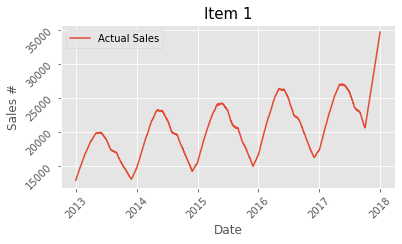

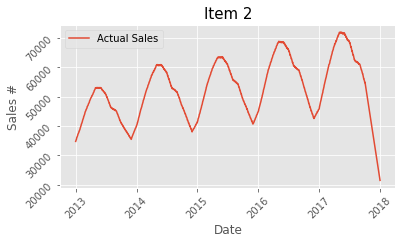

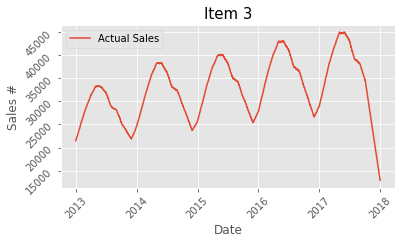

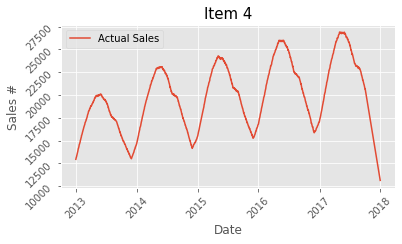

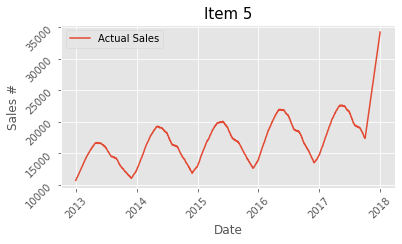

...

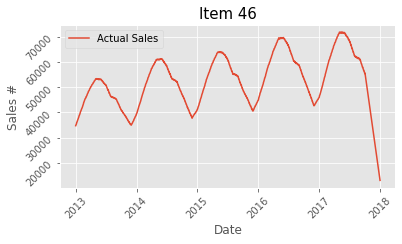

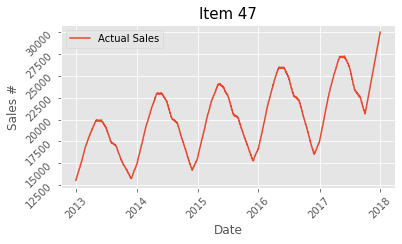

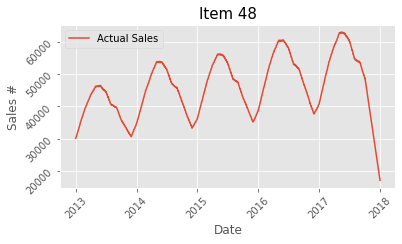

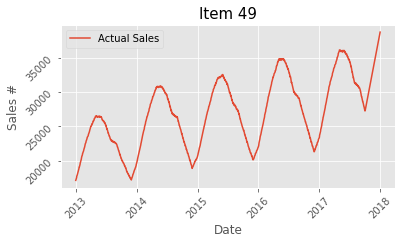

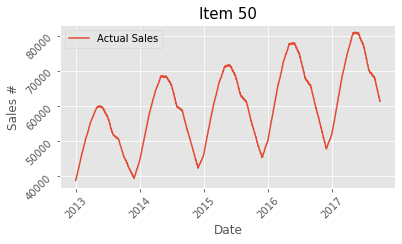

In [ ]:
for i in list(md['item'].unique()):
  plotdf = md[md['item']==i]
  plotdf = plotdf.drop(['item'], axis=1)
  #print('Item_'+str(i))
  #print(plotdf,'\n')

  plt.figure(figsize=(6,3))
  plt.plot(plotdf, label='Actual Sales')
  plt.title('Item {}'.format(i), size=15)
  plt.xlabel('Date', size=12)
  plt.ylabel('Sales #', size=12)
  plt.xticks(rotation=45, size=10)
  plt.yticks(rotation=45, size=10)
  plt.legend(loc='best')
  plt.show()

#### **Distribution**

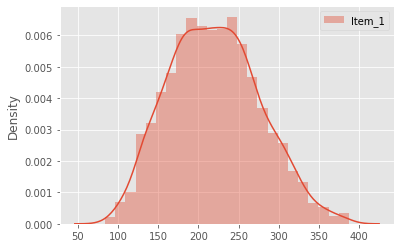

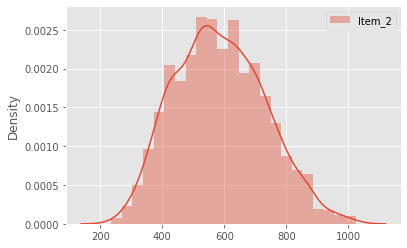

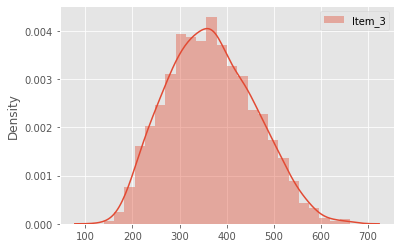

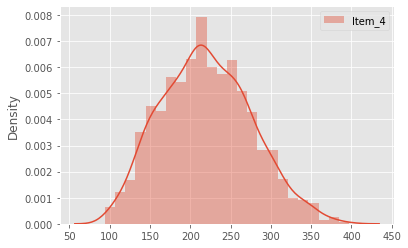

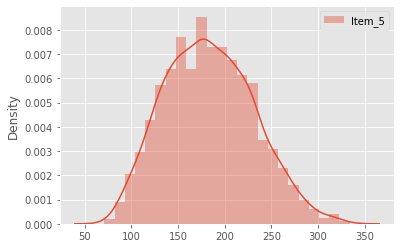

...

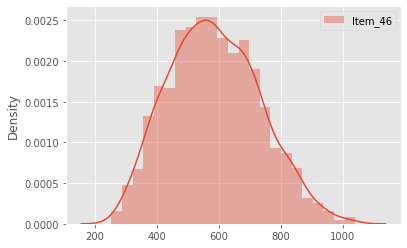

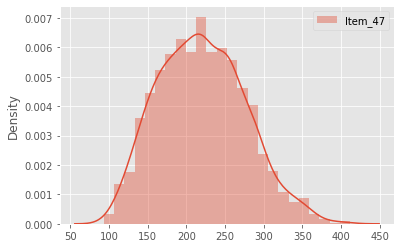

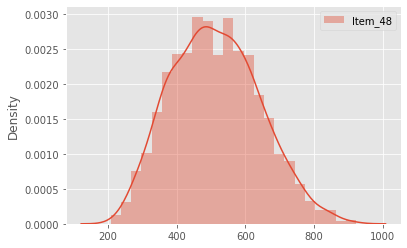

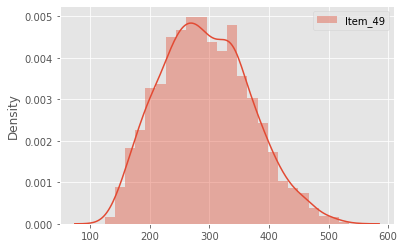

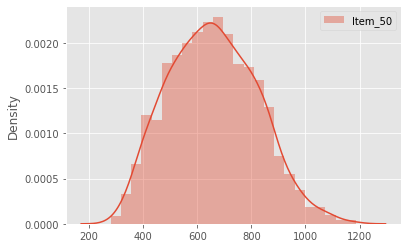

In [ ]:
dist = master_data.copy()
dist = dist.groupby(['item','date']).agg({'sales':'sum'}).reset_index()
year_list = list(dist['date'].dt.year.unique())

for i in list(dist['item'].unique()):
  plt.figure(figsize=(6,4))
  df = dist[dist['item']==i].set_index('date', drop=True).drop('item', axis=1)
  sns.distplot(df,label='Item_'+str(i))
  plt.legend(loc='best')

#### **Feature Engineering**

In [ ]:
# feature engineering

md = md.reset_index()

#md['day_name'] = md['date'].dt.day_name()
md['day_of_month'] = md['date'].dt.day
md['month'] = md['date'].dt.month
md['year'] = md['date'].dt.year
md['wk_of_year'] = md['date'].dt.weekofyear
md['quarter'] = md['date'].dt.quarter
md['is_month_start'] = md['date'].dt.is_month_start.astype(int)
md['is_month_end'] = md['date'].dt.is_month_end.astype(int)
md['is_quarter_start'] = md['date'].dt.is_quarter_start.astype(int)
md['is_quarter_end'] = md['date'].dt.is_quarter_end.astype(int)

md

,date,item,sales,day_of_month,month,year,wk_of_year,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end
0,2013-01-01,1,12848.0,1,1,2013,1,1,1,0,1,0
1,2013-01-02,1,12936.0,2,1,2013,1,1,0,0,0,0
2,2013-01-03,1,13019.0,3,1,2013,1,1,0,0,0,0
3,2013-01-04,1,13103.0,4,1,2013,1,1,0,0,0,0
4,2013-01-05,1,13153.0,5,1,2013,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
86844,2017-09-28,50,62200.0,28,9,2017,39,3,0,0,0,0
86845,2017-09-29,50,61962.0,29,9,2017,39,3,0,0,0,0
86846,2017-09-30,50,61687.0,30,9,2017,39,3,0,1,0,1
86847,2017-10-01,50,61392.0,1,10,2017,39,4,1,0,1,0


In [ ]:
md = md.set_index('date',drop=True)
md

,item,sales,day_of_month,month,year,wk_of_year,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end
date,,,,,,,,,,,
2013-01-01,1,12848.0,1,1,2013,1,1,1,0,1,0
2013-01-02,1,12936.0,2,1,2013,1,1,0,0,0,0
2013-01-03,1,13019.0,3,1,2013,1,1,0,0,0,0
2013-01-04,1,13103.0,4,1,2013,1,1,0,0,0,0
2013-01-05,1,13153.0,5,1,2013,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,50,62200.0,28,9,2017,39,3,0,0,0,0
2017-09-29,50,61962.0,29,9,2017,39,3,0,0,0,0
2017-09-30,50,61687.0,30,9,2017,39,3,0,1,0,1


## **Model 1 - Xtreme Gradient Boosting**

#### **Data Structuring**

In [ ]:
# dictionary for collecting the test data forecast results
test_forecast_dict_xgb = dict()

# dictionary for collecting the evaluation metrics of the test forecast
em_dict_xgb = dict()

#### **Model building & forecasting**

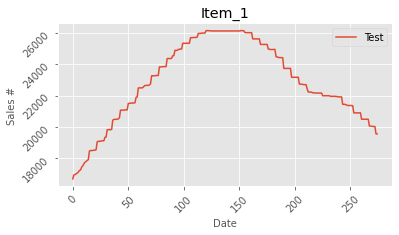

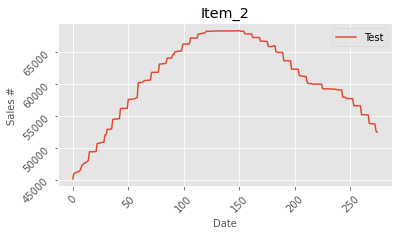

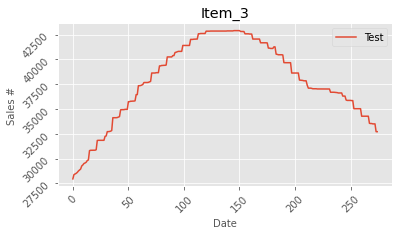

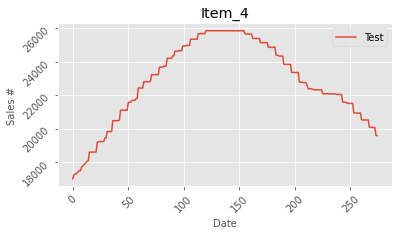

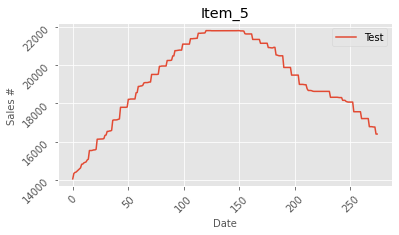

...

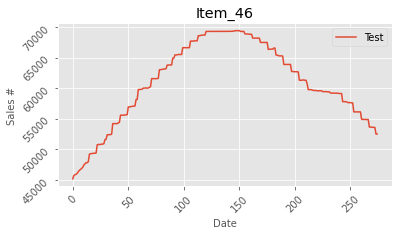

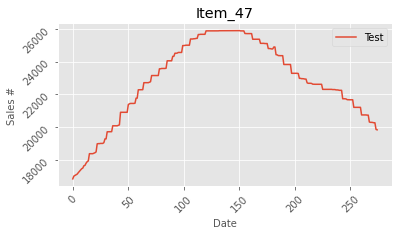

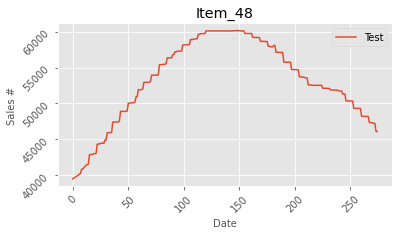

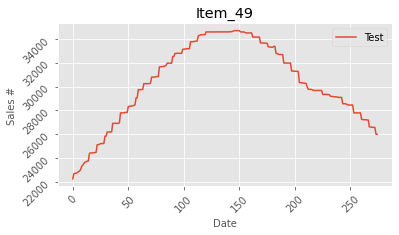

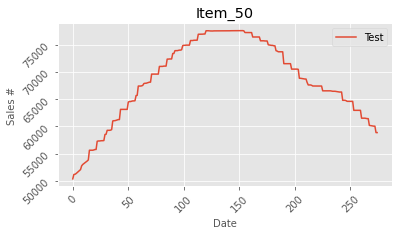

In [ ]:
# running a for loop with a list of unique items in the dataset as the iterable
for i in list(md['item'].unique()):

  # filtering the data item-wise
  data = md[md['item']==i].drop(['item'], axis=1)
  #print(data)
  
  # Splitting the dataset into dependent and independent variable
  x = data.drop(['sales'], axis=1)
  y = data['sales']
   
  # Splitting data into training and testing sets
  # Here, we are limiting the test data upto 02/10/2017 because item no 50 is missing 90 days of data as a result of
  # rolling(90), shift(-90) and dropna() Hence, extending the prediction upto 31/12/2017 is resulting in a Value Error.
  
  x_train = x.loc[:'2016-12-31']
  x_test = x.loc['2017-01-01':'2017-10-02'] 
  y_train = y.loc[:'2016-12-31']
  y_test = y.loc['2017-01-01':'2017-10-02']

  #print('Item_'+str(i),'\n')
  #print(x_train,'\n')
  #print(y_train,'\n')
  #print(x_test,'\n')
  #print(y_test,'\n')
 
  # Model Building
  # Xtreme Gradient Boosting

  # Initializing the model
  xgbr = XGB(verbosity=0)
  
  # Fitting the data to the model
  xgbr.fit(x_train, y_train)

  # computing training score
  #train_score = xgbr.score(x_train, y_train)
  #cvs_train = cross_val_score(xgbr, x_train, y_train,cv=10)
  #print("Training score - {}".format(train_score))
  #print('Mean cv score - ',cvs_train.mean(),'\n')

  # predicting the test data
  y_pred = xgbr.predict(x_test)
  
  # creating key and value for test_forecast dictionary
  k = 'Item_'+str(i)
  v = y_pred

  # dictionary for test data
  test_forecast_dict_xgb.update({k:v})

  # Statistics
  Mean = data['sales'].mean()
  Std_dev = data['sales'].std()

  # Evaluation Metrics
  r2 = r2_score(y_test, y_pred)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_test, y_pred)
  mape = mean_absolute_percentage_error(y_test, y_pred)

  # creating a key and value for test_forecast evaluation metrics dictionary
  key = 'Item_'+str(i)
  value = {'r2':r2, 'MSE':mse, 'RMSE':rmse, 'MAE':mae, 'MAPE':mape}
  em_dict_xgb.update({key:value})

  #print('Dataset Statistics')
  #print('Mean - {}'.format(Mean))
  #print('Std dev - {}'.format(Std_dev),'\n')

  # Data Visualization
  plt.figure(figsize=(6,3))
  plt.title('Item_'+str(i))
  plt.plot(y_pred, label='Test')    # test data 
  #plt.plot(data.sales, label='Actual')  # actual sales
  plt.xlabel('Date', size=10)
  plt.ylabel('Sales #', size=10)
  plt.xticks(rotation=45)
  plt.yticks(rotation=45)
  plt.legend(loc='best')
  plt.show()

In [ ]:
# Dataframe for test data forecast
test_forecast_dict_xgb_df = pd.DataFrame(test_forecast_dict_xgb, index=[pd.date_range(start='2017-01-01', end='2017-10-02')])

# function for rounding off
def rounding_xgb(x):
  a = round(x,2)
  return a

for i in test_forecast_dict_xgb_df.columns:
  test_forecast_dict_xgb_df[i] = test_forecast_dict_xgb_df[i].apply(lambda x:rounding_xgb(x))

test_forecast_dict_xgb_df

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,16684.70,45129.80,27953.97,17002.74,14045.18,45386.82,44898.91,59183.72,39245.49,56326.88,...,17180.29,28171.76,39438.44,22619.63,61734.14,45157.35,16820.78,39454.21,22246.82,50340.66
2017-01-02,16934.68,45970.45,28384.74,17235.39,14332.04,45637.27,45477.79,59573.31,39866.13,57183.14,...,17269.72,28573.14,40121.25,22749.72,62536.73,45708.31,16991.32,39587.09,22683.62,51149.18
2017-01-03,16958.41,46090.83,28445.24,17291.10,14381.05,45695.79,45578.31,59791.14,39946.62,57357.74,...,17328.87,28622.76,40255.87,22798.36,62646.70,45840.73,17030.21,39657.07,22714.11,51186.47
2017-01-04,17002.37,46120.59,28512.00,17302.55,14403.23,45763.68,45589.13,59932.02,40003.24,57407.95,...,17372.15,28709.53,40296.29,22903.05,62787.84,45904.45,17074.93,39782.62,22714.11,51315.82
2017-01-05,17053.03,46193.71,28608.12,17370.95,14458.89,45908.24,45772.00,60056.52,40068.17,57704.27,...,17404.82,28806.18,40463.49,22964.17,62945.45,46073.80,17114.11,39875.74,22778.51,51496.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,20030.83,53768.78,33497.39,20074.09,16774.21,53824.52,53280.09,70251.63,47102.53,67203.94,...,19950.92,33567.39,47074.55,26675.04,73683.70,53612.37,20274.88,47260.09,26569.04,60058.38
2017-09-29,20030.83,53768.78,33497.39,20067.77,16766.50,53764.89,53236.96,70236.42,47069.02,67176.91,...,19942.88,33567.39,47074.55,26675.04,73605.41,53572.58,20257.03,47204.31,26558.57,60021.47
2017-09-30,20030.83,53768.78,33497.39,20067.77,16766.50,53764.89,53211.74,70236.42,47069.02,67176.91,...,19942.88,33567.39,47074.55,26675.04,73605.41,53572.58,20257.03,47204.31,26558.57,60021.47
2017-10-01,19558.65,52648.12,32710.89,19591.58,16397.51,52584.67,52122.39,68997.60,46045.63,65795.48,...,19554.85,32805.52,46052.64,26111.07,72018.48,52492.39,19850.15,46093.08,25995.12,58838.86


In [ ]:
test_forecast_dict_xgb_df = test_forecast_dict_xgb_df.reset_index()
test_forecast_dict_xgb_df

,level_0,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
0,2017-01-01,16684.70,45129.80,27953.97,17002.74,14045.18,45386.82,44898.91,59183.72,39245.49,...,17180.29,28171.76,39438.44,22619.63,61734.14,45157.35,16820.78,39454.21,22246.82,50340.66
1,2017-01-02,16934.68,45970.45,28384.74,17235.39,14332.04,45637.27,45477.79,59573.31,39866.13,...,17269.72,28573.14,40121.25,22749.72,62536.73,45708.31,16991.32,39587.09,22683.62,51149.18
2,2017-01-03,16958.41,46090.83,28445.24,17291.10,14381.05,45695.79,45578.31,59791.14,39946.62,...,17328.87,28622.76,40255.87,22798.36,62646.70,45840.73,17030.21,39657.07,22714.11,51186.47
3,2017-01-04,17002.37,46120.59,28512.00,17302.55,14403.23,45763.68,45589.13,59932.02,40003.24,...,17372.15,28709.53,40296.29,22903.05,62787.84,45904.45,17074.93,39782.62,22714.11,51315.82
4,2017-01-05,17053.03,46193.71,28608.12,17370.95,14458.89,45908.24,45772.00,60056.52,40068.17,...,17404.82,28806.18,40463.49,22964.17,62945.45,46073.80,17114.11,39875.74,22778.51,51496.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
270,2017-09-28,20030.83,53768.78,33497.39,20074.09,16774.21,53824.52,53280.09,70251.63,47102.53,...,19950.92,33567.39,47074.55,26675.04,73683.70,53612.37,20274.88,47260.09,26569.04,60058.38
271,2017-09-29,20030.83,53768.78,33497.39,20067.77,16766.50,53764.89,53236.96,70236.42,47069.02,...,19942.88,33567.39,47074.55,26675.04,73605.41,53572.58,20257.03,47204.31,26558.57,60021.47
272,2017-09-30,20030.83,53768.78,33497.39,20067.77,16766.50,53764.89,53211.74,70236.42,47069.02,...,19942.88,33567.39,47074.55,26675.04,73605.41,53572.58,20257.03,47204.31,26558.57,60021.47
273,2017-10-01,19558.65,52648.12,32710.89,19591.58,16397.51,52584.67,52122.39,68997.60,46045.63,...,19554.85,32805.52,46052.64,26111.07,72018.48,52492.39,19850.15,46093.08,25995.12,58838.86


In [ ]:
test_forecast_dict_xgb_df = test_forecast_dict_xgb_df.set_index('level_0', drop=True)
test_forecast_dict_xgb_df.index.name=None

In [ ]:
# Dictionary for performance evaluation metrics
em_dict_xgb_df = pd.DataFrame(em_dict_xgb)

# user defined function for rounding the results
def rounding_em(x):
  em = round(x,2)
  return em

for i in em_dict_xgb_df.columns:
  em_dict_xgb_df[i] = em_dict_xgb_df[i].apply(lambda x:rounding_em(x))

em_dict_xgb_df

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
r2,0.90,0.87,0.84,0.90,0.90,0.91,0.89,0.85,0.88,0.85,...,0.86,0.89,0.84,0.88,0.86,0.90,0.85,0.85,0.84,0.89
MSE,704321.18,6125169.48,2875931.81,650780.29,451650.32,4361230.12,5026251.35,11686040.11,3861000.69,10554070.58,...,988157.41,1862603.31,5543765.15,1467573.54,12460877.83,4978031.88,1056334.19,5023578.67,1899590.52,6387694.52
RMSE,839.24,2474.91,1695.86,806.71,672.05,2088.36,2241.93,3418.49,1964.94,3248.70,...,994.06,1364.77,2354.52,1211.43,3530.00,2231.15,1027.78,2241.33,1378.26,2527.39
MAE,797.36,2374.10,1657.23,760.45,657.80,2024.51,2162.02,3344.51,1918.48,3206.41,...,923.94,1331.61,2287.94,1172.50,3472.36,2167.64,985.93,2213.40,1361.88,2462.46
MAPE,0.03,0.04,0.04,0.03,0.03,0.03,0.03,0.04,0.04,0.04,...,0.04,0.03,0.04,0.04,0.04,0.03,0.04,0.04,0.04,0.03


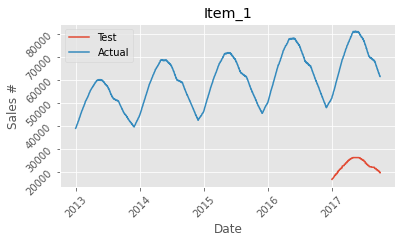

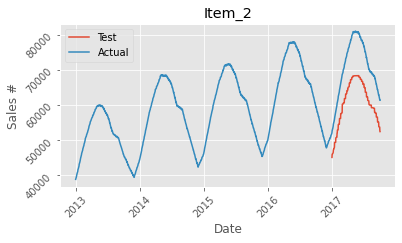

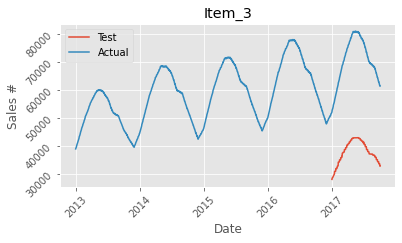

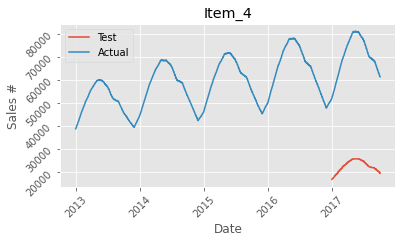

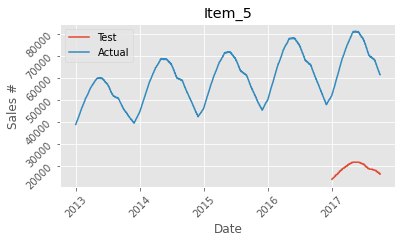

...

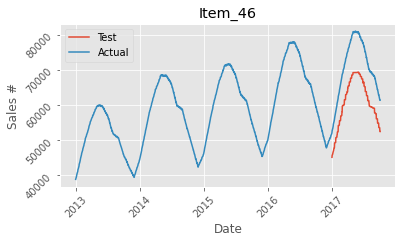

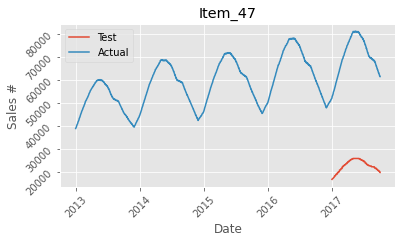

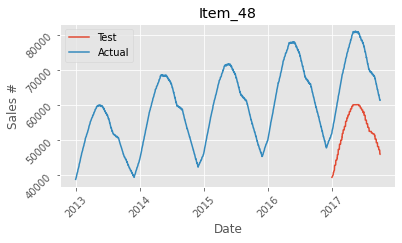

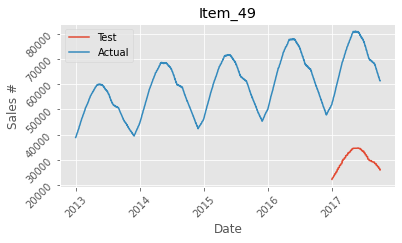

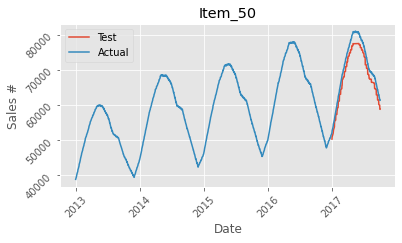

In [ ]:
# plotting forecast and actual sales

for k, v in test_forecast_dict_xgb.items():
  forecast = pd.DataFrame(v, index=pd.date_range(start='2017-01-01', end='2017-10-02'))
  plt.figure(figsize=(6,3))
  plt.title(k)
  plt.plot(forecast, label='Test')
  plt.plot(data.sales, label='Actual')
  plt.xlabel('Date', size=12)
  plt.ylabel('Sales #', size=12)
  plt.xticks(rotation=45, size=10)
  plt.yticks(rotation=45, size=10)
  plt.legend(loc='best')
  plt.show()

In [ ]:
dfxgb = master_data.copy()

dfxgb = dfxgb.groupby(['item','date']).agg({'sales':'sum'}).reset_index().set_index('date', drop=True)
dfxgb = dfxgb.groupby(['item']).sales.rolling(90).sum().shift(-90).dropna().reset_index()
dfxgb = pd.pivot_table(data=dfxgb, columns ='item', values='sales', index='date', aggfunc='sum')
dfxgb.index.name=None
dfxgb.columns.name=None
dfxgb_column_names = ['Item_'+str(i) for i in dfxgb.columns]
dfxgb.columns = dfxgb_column_names
dfxgb

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2013-01-01,12848.0,34724.0,21472.0,12940.0,10678.0,34380.0,34470.0,45320.0,30547.0,42939.0,...,12960.0,21459.0,30282.0,17293.0,47231.0,34700.0,13015.0,30109.0,17164.0,38874.0
2013-01-02,12936.0,34917.0,21580.0,13041.0,10756.0,34531.0,34674.0,45549.0,30726.0,43159.0,...,13001.0,21519.0,30442.0,17357.0,47482.0,34864.0,13072.0,30226.0,17254.0,39034.0
2013-01-03,13019.0,35113.0,21664.0,13109.0,10800.0,34688.0,34836.0,45772.0,30882.0,43399.0,...,13077.0,21619.0,30558.0,17429.0,47676.0,35004.0,13139.0,30348.0,17329.0,39200.0
2013-01-04,13103.0,35248.0,21783.0,13155.0,10857.0,34831.0,35030.0,46030.0,31030.0,43555.0,...,13140.0,21765.0,30682.0,17481.0,47943.0,35177.0,13183.0,30509.0,17400.0,39378.0
2013-01-05,13153.0,35399.0,21927.0,13220.0,10928.0,35030.0,35207.0,46216.0,31189.0,43774.0,...,13214.0,21865.0,30868.0,17539.0,48184.0,35344.0,13248.0,30629.0,17482.0,39596.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-29,20704.0,55278.0,34913.0,20814.0,17453.0,55195.0,55398.0,73266.0,48114.0,69588.0,...,20635.0,34633.0,48915.0,27960.0,76174.0,55856.0,20796.0,48893.0,27502.0,61962.0
2017-09-30,20642.0,55020.0,34763.0,20693.0,17411.0,54955.0,55139.0,72910.0,47936.0,69244.0,...,20543.0,34439.0,48672.0,27833.0,75784.0,55614.0,20731.0,48699.0,27346.0,61687.0
2017-10-01,20578.0,54778.0,34648.0,20635.0,17349.0,54758.0,54985.0,72669.0,47811.0,68947.0,...,20445.0,34309.0,48472.0,27718.0,75504.0,55435.0,20648.0,48587.0,27262.0,61392.0
2017-10-02,20610.0,54886.0,34718.0,20647.0,17377.0,54789.0,55073.0,72762.0,47920.0,69005.0,...,20496.0,34371.0,48507.0,27762.0,75603.0,55565.0,20692.0,48651.0,27275.0,61395.0


In [ ]:
# dfxgb - Actual sales (demand)
# test_forecast_dict_xgb_df - Forecast (supply)

# (Forecast - Actual) = (Supply - Demand) > 0 => Rs 10 else Rs 3

results_xgb = (test_forecast_dict_xgb_df - dfxgb).dropna()

# Actual sales = Demand
# Forecast sales = Supply
# When demand > supply = Oppurtunity loss - multiply by Rs 3
# When demand < supply = Retention loss - multiplt by Rs 10

def orloss(x):
  if x > 0:
    x = x*10
    return x
  else:
    x = x*3
    return x

for i in results_xgb.columns:
  results_xgb[i] = results_xgb[i].apply(lambda x: orloss(x))

results_xgb

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,-2049.90,-2925.60,-3213.09,-375.78,-2111.46,-2964.54,-3975.27,-5208.84,-6457.53,-6282.36,...,-566.13,-2799.72,-4345.68,-1495.11,-6728.58,-3118.95,-1983.66,-4397.37,-3648.54,-5650.02
2017-01-02,-1752.96,-1876.65,-2787.78,-157.83,-1655.88,-3716.19,-3492.63,-6008.07,-5837.61,-5552.58,...,-804.84,-2507.58,-3608.25,-1773.84,-6339.81,-2762.07,-2057.04,-5279.73,-3094.14,-4760.46
2017-01-03,-1846.77,-1971.51,-3053.28,-170.70,-1667.85,-3930.63,-3599.07,-5873.58,-5986.14,-5658.78,...,-789.39,-2553.72,-3567.39,-1747.92,-6636.90,-2766.81,-2045.37,-5480.79,-3233.67,-5197.59
2017-01-04,-1927.89,-2731.23,-3195.00,-364.35,-1832.31,-4341.96,-4208.61,-6455.94,-6233.28,-6486.15,...,-959.55,-2659.41,-3917.13,-1922.85,-7116.48,-3076.65,-2166.21,-5875.14,-3590.67,-5526.54
2017-01-05,-1994.91,-3222.87,-3344.64,-324.15,-1854.33,-4460.28,-4188.00,-6775.44,-6404.49,-6317.19,...,-1083.54,-2705.46,-3814.53,-1979.49,-7567.65,-3027.60,-2261.67,-6126.78,-3736.47,-5454.54
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,-2295.51,-5271.66,-4621.83,-2453.73,-2222.37,-4705.44,-6929.73,-10036.11,-3652.41,-8064.18,...,-2328.24,-3526.83,-6199.35,-4220.88,-8637.90,-7525.89,-1851.36,-5585.73,-3083.88,-6424.86
2017-09-29,-2019.51,-4527.66,-4246.83,-2238.69,-2059.50,-4290.33,-6483.12,-9088.74,-3134.94,-7233.27,...,-2076.36,-3196.83,-5521.35,-3854.88,-7705.77,-6850.26,-1616.91,-5066.07,-2830.29,-5821.59
2017-09-30,-1833.51,-3753.66,-3796.83,-1875.69,-1933.50,-3570.33,-5781.78,-8020.74,-2600.94,-6201.27,...,-1800.36,-2614.83,-4792.35,-3473.88,-6535.77,-6124.26,-1421.91,-4484.07,-2362.29,-4996.59
2017-10-01,-3058.05,-6389.64,-5811.33,-3130.26,-2854.47,-6519.99,-8587.83,-11014.20,-5296.11,-9454.56,...,-2670.45,-4510.44,-7258.08,-4820.79,-10456.56,-8827.83,-2393.55,-7481.76,-3800.64,-7659.42


## **Model 2 - Decision Tree Regressor**

In [ ]:
md_dt = md.copy()
md_dt

,item,sales,day_of_month,month,year,wk_of_year,quarter,is_month_start,is_month_end,is_quarter_start,is_quarter_end
date,,,,,,,,,,,
2013-01-01,1,12848.0,1,1,2013,1,1,1,0,1,0
2013-01-02,1,12936.0,2,1,2013,1,1,0,0,0,0
2013-01-03,1,13019.0,3,1,2013,1,1,0,0,0,0
2013-01-04,1,13103.0,4,1,2013,1,1,0,0,0,0
2013-01-05,1,13153.0,5,1,2013,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,50,62200.0,28,9,2017,39,3,0,0,0,0
2017-09-29,50,61962.0,29,9,2017,39,3,0,0,0,0
2017-09-30,50,61687.0,30,9,2017,39,3,0,1,0,1


#### **Data Structuring**

In [ ]:
# dictionary for collecting the test data forecast results
test_forecast_dict_dt = dict()

# dictionary for collecting the evaluation metrics of the test forecast
em_dict_dt = dict()

#### **Model building & forecasting**

In [ ]:
# running a for loop with a list of unique items in the dataset as the iterable
for i in list(md_dt['item'].unique()):
 
  # filtering the data item-wise
  split_data_dt = md_dt[md_dt['item']==i].drop(['item'], axis=1)
  #print(split_data)
  
  # Splitting the dataset into dependent and independent variable
  x_dt = split_data_dt.drop(['sales'], axis=1)
  y_dt = split_data_dt['sales']
  #print('Item_'+str(i))
  
  # Splitting data into training and testing sets
  # Here, we are limiting the test data upto 02/10/2017 because item no 50 is missing 90 days of data as a result of
  # rolling(90), shift(-90) and dropna() Hence, extending the prediction upto 31/12/2017 is resulting in a Value Error.
  
  x_train_dt = x_dt.loc[:'2016-12-31']
  x_test_dt = x_dt.loc['2017-01-01':'2017-10-02'] 
  y_train_dt = y_dt.loc[:'2016-12-31']
  y_test_dt = y_dt.loc['2017-01-01':'2017-10-02']

  # Model Building
  # Decision Tree Regression

  # Initializing the model
  dtr_model = DecisionTreeRegressor(max_depth=18)
  
  # Fitting the data to the model
  dtr_model.fit(x_train_dt, y_train_dt)
   
  # computing training score
  train_score_dt = dtr_model.score(x_train_dt, y_train_dt)
  cvs_train_dt = cross_val_score(dtr_model, x_train_dt, y_train_dt, cv=10)

  #print("Training score - {}".format(train_score_dt))
  #print('Mean cv score - ',round(cvs_train_dt.mean(),4),'\n')

  # predicting the test data
  y_pred_dt = dtr_model.predict(x_test_dt)

  # creating key and value for test_forecast dictionary
  k = 'Item_'+str(i) #key
  v = y_pred_dt #value
  
  # adding elements to the dictionary
  test_forecast_dict_dt.update({k:v})

  # Statistics of dataset
  Mean = round(split_data_dt['sales'].mean(),4)
  Std_dev = round(split_data_dt['sales'].std(),4)

  # Performance Evaluation Metrics
  r2_dt = r2_score(y_test_dt, y_pred_dt)
  mse_dt = mean_squared_error(y_test_dt, y_pred_dt)
  rmse_dt = np.sqrt(mse_dt)
  mae_dt = mean_absolute_error(y_test_dt, y_pred_dt)
  mape_dt = mean_absolute_percentage_error(y_test_dt, y_pred_dt)

  # creating a key and value for test_forecast evaluation metrics dictionary
  key_dt = 'Item_'+str(i)
  value_dt = {'r2':r2_dt, 'MSE':mse_dt, 'RMSE':rmse_dt, 'MAE':mae_dt, 'MAPE':mape_dt}
  em_dict_dt.update({key_dt:value_dt})

In [ ]:
max_depth = dict()
for i in range(1,22):
  dtr_hpt = DecisionTreeRegressor(max_depth=i)
  hypt_model = dtr_hpt.fit(x_train_dt, y_train_dt)
  train_score = hypt_model.score(x_train_dt, y_train_dt)
  #test_score = hypt_model.score(x_train_dt, y_train_dt)
  k = 'Depth_'+str(i)
  #v = [train_score, test_score]
  v = [train_score]
  max_depth.update({k:v})

max_depth = pd.DataFrame(max_depth)
max_depth = max_depth.transpose()
max_depth.index
#max_depth.columns=['Train', 'Test']
max_depth.columns=['Train']
max_depth

,Train
Depth_1,0.356567
Depth_2,0.572244
Depth_3,0.769198
Depth_4,0.877455
Depth_5,0.943708
Depth_6,0.975906
Depth_7,0.988492
Depth_8,0.995158
Depth_9,0.998352
Depth_10,0.999486


In [ ]:
# inspecting the model
dtr_model.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': 18,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': None,
 'splitter': 'best'}

In [ ]:
# creating a dataframe out of dictionary that stored the forecast of the test data
# multiindex can be solved by resetting the index and assigning it back

test_forecast_dict_dt_df = pd.DataFrame(test_forecast_dict_dt, index=[pd.date_range(start='2017-01-01', end='2017-10-02')])
test_forecast_dict_dt_df = test_forecast_dict_dt_df.reset_index()

In [ ]:
test_forecast_dict_dt_df = test_forecast_dict_dt_df.set_index('level_0', drop=True)

In [ ]:
# Data Visualization - Actual & Test sales

'''
for k,v in test_forecast_dict_dt.items():
  plotdf_dt = pd.DataFrame(v, index=pd.date_range(start='2017-01-01', end='2017-10-02'))
  plt.figure(figsize=(8,4))
  plt.title('{}'.format(k))
  plt.plot(plotdf_dt, label='Test Sales')
  plt.plot(split_data_dt.sales, label='Actual Sales')
  plt.xlabel('Date', size=10)
  plt.ylabel('Sales #', size=10)
  plt.xticks(rotation=45)
  plt.yticks(rotation=45)
  plt.legend(loc='best')
  plt.show()
  '''

"\nfor k,v in test_forecast_dict_dt.items():\n  plotdf_dt = pd.DataFrame(v, index=pd.date_range(start='2017-01-01', end='2017-10-02'))\n  plt.figure(figsize=(8,4))\n  plt.title('{}'.format(k))\n  plt.plot(plotdf_dt, label='Test Sales')\n  plt.plot(split_data_dt.sales, label='Actual Sales')\n  plt.xlabel('Date', size=10)\n  plt.ylabel('Sales #', size=10)\n  plt.xticks(rotation=45)\n  plt.yticks(rotation=45)\n  plt.legend(loc='best')\n  plt.show()\n  "

In [ ]:
# creating a dataframe out of the dictionary that stored the performance metrics of the test forecast

em_dict_dt_df = pd.DataFrame(em_dict_dt)
em_dict_dt_df

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
r2,0.901636,8.762450e-01,8.483575e-01,0.910396,0.905566,9.096374e-01,9.011845e-01,8.585121e-01,8.856057e-01,8.508468e-01,...,0.870176,8.962775e-01,8.471963e-01,8.833309e-01,8.643404e-01,9.012725e-01,8.527034e-01,8.509544e-01,8.388973e-01,8.976227e-01
MSE,665516.301136,5.808175e+06,2.755226e+06,609036.370061,423173.232424,4.168306e+06,4.649967e+06,1.133246e+07,3.797190e+06,1.035456e+07,...,934062.073373,1.795645e+06,5.341023e+06,1.375625e+06,1.198839e+07,4.706167e+06,1.028169e+06,4.984694e+06,1.877569e+06,6.180062e+06
RMSE,815.791825,2.410016e+03,1.659887e+03,780.407823,650.517665,2.041643e+03,2.156378e+03,3.366372e+03,1.948638e+03,3.217850e+03,...,966.468868,1.340017e+03,2.311065e+03,1.172870e+03,3.462425e+03,2.169370e+03,1.013987e+03,2.232643e+03,1.370244e+03,2.485973e+03
MAE,795.657273,2.352291e+03,1.644359e+03,754.767273,646.820000,1.993709e+03,2.123909e+03,3.347469e+03,1.896218e+03,3.195036e+03,...,912.873273,1.325184e+03,2.279315e+03,1.157928e+03,3.448255e+03,2.141469e+03,9.741055e+02,2.211211e+03,1.359007e+03,2.455911e+03
MAPE,0.034072,3.687460e-02,4.156144e-02,0.031615,0.033034,3.189099e-02,3.368502e-02,4.038671e-02,3.497816e-02,4.049421e-02,...,0.037441,3.372357e-02,4.091991e-02,3.665807e-02,3.982128e-02,3.397445e-02,4.074064e-02,4.043761e-02,4.354642e-02,3.463981e-02


In [ ]:
df_dt = master_data.copy()
df_dt = df_dt.groupby(['item','date']).agg({'sales':'sum'}).reset_index().set_index('date', drop=True)
df_dt = df_dt.groupby('item').sales.rolling(90).sum().shift(-90).dropna().reset_index()
df_dt = pd.pivot_table(data=df_dt, values='sales', columns='item', index='date', aggfunc='sum')
df_dt.index.name=None
df_dt.columns.name=None
df_dt_columns_names = ['Item_'+str(i) for i in df_dt.columns]
df_dt.columns = df_dt_columns_names
df_dt.head()

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2013-01-01,12848.0,34724.0,21472.0,12940.0,10678.0,34380.0,34470.0,45320.0,30547.0,42939.0,...,12960.0,21459.0,30282.0,17293.0,47231.0,34700.0,13015.0,30109.0,17164.0,38874.0
2013-01-02,12936.0,34917.0,21580.0,13041.0,10756.0,34531.0,34674.0,45549.0,30726.0,43159.0,...,13001.0,21519.0,30442.0,17357.0,47482.0,34864.0,13072.0,30226.0,17254.0,39034.0
2013-01-03,13019.0,35113.0,21664.0,13109.0,10800.0,34688.0,34836.0,45772.0,30882.0,43399.0,...,13077.0,21619.0,30558.0,17429.0,47676.0,35004.0,13139.0,30348.0,17329.0,39200.0
2013-01-04,13103.0,35248.0,21783.0,13155.0,10857.0,34831.0,35030.0,46030.0,31030.0,43555.0,...,13140.0,21765.0,30682.0,17481.0,47943.0,35177.0,13183.0,30509.0,17400.0,39378.0
2013-01-05,13153.0,35399.0,21927.0,13220.0,10928.0,35030.0,35207.0,46216.0,31189.0,43774.0,...,13214.0,21865.0,30868.0,17539.0,48184.0,35344.0,13248.0,30629.0,17482.0,39596.0


In [ ]:
results_dt = (test_forecast_dict_dt_df - df_dt.loc['2017-01-01':'2017-10-02']).dropna()
results_dt.index.name=None

def orlossdt(x):
  if x > 0:
    x = x*10
    return x
  else:
    x = x*3
    return x

for i in results_dt.columns:
  results_dt[i] = results_dt[i].apply(lambda x: orlossdt(x))

results_dt

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,-2274.0,-3576.0,-3732.0,-951.0,-2379.0,-5727.0,-5556.0,-8178.0,-7596.0,-7251.0,...,-1416.0,-3243.0,-5025.0,-2133.0,-8565.0,-3939.0,-2370.0,-6507.0,-4326.0,-6519.0
2017-01-02,-2448.0,-2529.0,-4101.0,-1107.0,-1728.0,-6444.0,-3774.0,-9192.0,-6363.0,-5700.0,...,-828.0,-2352.0,-5733.0,-1419.0,-9588.0,-4554.0,-1944.0,-5499.0,-3564.0,-5028.0
2017-01-03,-2472.0,-2985.0,-4125.0,-1014.0,-1887.0,-6216.0,-4182.0,-8562.0,-6753.0,-6330.0,...,-990.0,-2547.0,-5580.0,-1539.0,-9324.0,-4206.0,-2049.0,-5910.0,-3795.0,-5577.0
2017-01-04,-2190.0,-3834.0,-3813.0,-684.0,-2118.0,-5370.0,-4824.0,-7554.0,-7170.0,-7308.0,...,-1290.0,-2913.0,-4812.0,-2028.0,-8265.0,-3360.0,-2304.0,-6681.0,-4152.0,-6294.0
2017-01-05,-2280.0,-4203.0,-3936.0,-621.0,-2187.0,-5538.0,-4977.0,-7758.0,-7308.0,-7365.0,...,-1365.0,-3009.0,-4935.0,-2061.0,-8637.0,-3423.0,-2391.0,-6780.0,-4194.0,-6255.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,-2343.0,-4707.0,-4761.0,-2499.0,-2211.0,-4944.0,-6153.0,-8769.0,-3378.0,-7638.0,...,-2049.0,-3450.0,-6081.0,-3936.0,-8700.0,-6690.0,-1815.0,-5688.0,-2919.0,-5721.0
2017-09-29,-2337.0,-4758.0,-4791.0,-2589.0,-2178.0,-4953.0,-6321.0,-8763.0,-3405.0,-7710.0,...,-2058.0,-3630.0,-6102.0,-4050.0,-8349.0,-6453.0,-1725.0,-5646.0,-2898.0,-5877.0
2017-09-30,-2439.0,-4662.0,-4752.0,-2439.0,-2322.0,-4929.0,-6333.0,-8475.0,-3432.0,-7473.0,...,-2133.0,-3483.0,-5862.0,-4050.0,-8043.0,-6507.0,-1872.0,-5772.0,-2730.0,-5652.0
2017-10-01,-2250.0,-4563.0,-4806.0,-2454.0,-2361.0,-5055.0,-6507.0,-8703.0,-3543.0,-7335.0,...,-2049.0,-3429.0,-5751.0,-3867.0,-7941.0,-6495.0,-1734.0,-5901.0,-2694.0,-5319.0


## **Model 3 - Holt Winter's**

### **Approach 1** - *resampling by month*

In [ ]:
# importing the data, parsing the date column and setting it as the index

df = master_data.copy()
df

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10
...,...,...
2017-12-27,50,63
2017-12-28,50,59
2017-12-29,50,74


#### **Data Exploration**

In [ ]:
df.head()

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10


In [ ]:
# total number of items in the dataset
df.item.nunique()

50

In [ ]:
# total number of stores in the dataset
#df.store.nunique()

In [ ]:
# total number of unique dates
df.index.value_counts()

2013-01-01    500
2016-05-11    500
2016-05-09    500
2016-05-08    500
2016-05-07    500
             ... 
2014-08-29    500
2014-08-28    500
2014-08-27    500
2014-08-26    500
2017-12-31    500
Name: date, Length: 1826, dtype: int64

#### **Data structuring**

In [ ]:
# creating dictionaries for storing the forecast values and performance mmetrics

test_forecast_dict = dict()
future_forecast_dict = dict()
test_em_dict = dict()

#### **Model building & Forecasting**

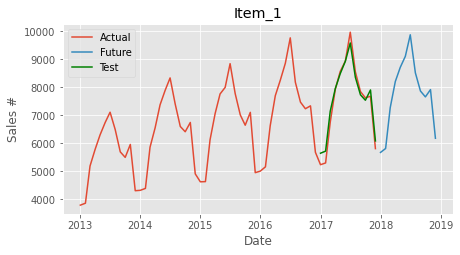

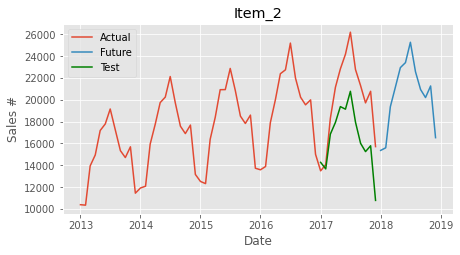

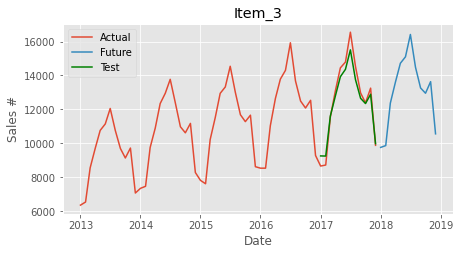

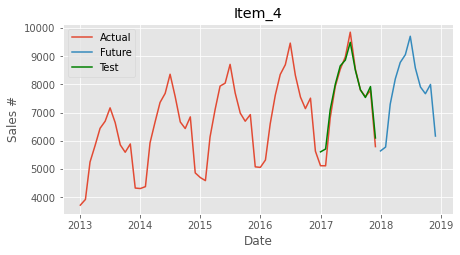

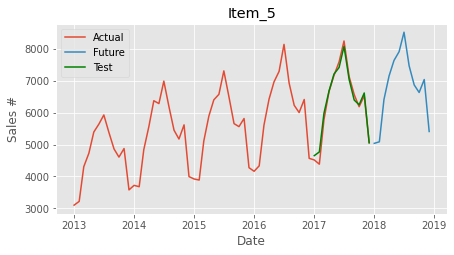

...

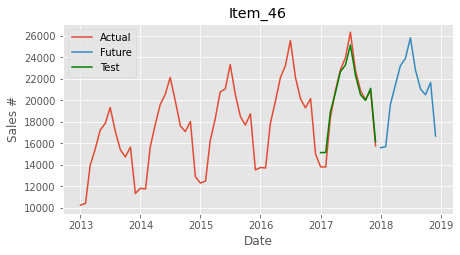

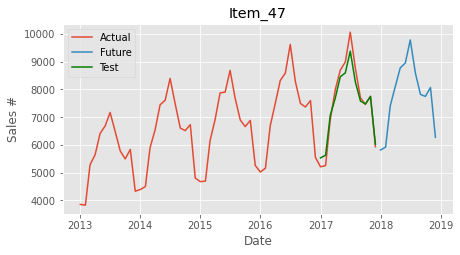

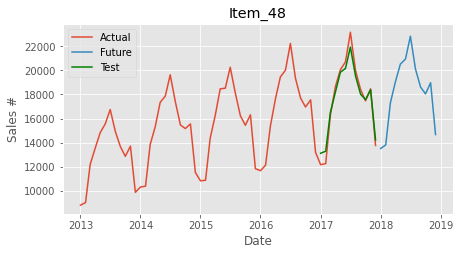

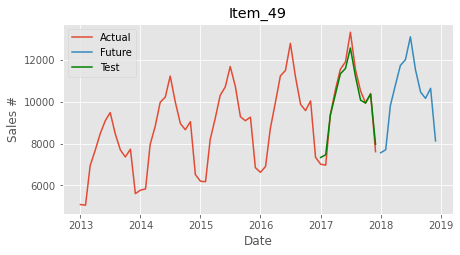

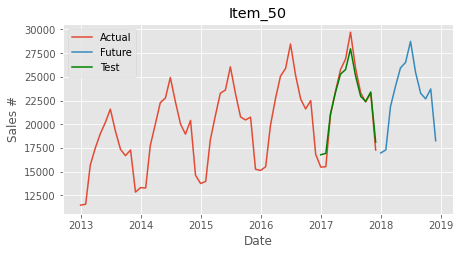

In [ ]:
# list of items in the dataset
item_list = list(df['item'].unique())

for i in item_list:

  # Filtering the dataset by items
  a = df[df['item']==i]

  # Data Wrangling
  a = a.groupby(['item','date']).agg({'sales':'sum'}).reset_index()
  a = a.set_index('date', drop=True)
  a = a.groupby(['item']).sales.resample('MS').sum().reset_index().set_index('date', drop=True)
  #a = a.groupby(['item']).sales.rolling(3).sum().shift(-3).dropna().reset_index()
  #a = a.set_index('date', drop=True)
  a = a.drop('item', axis=1)
  #print(a)
      
  #Splitting the data into training and testing sets
  train = a.loc[:'2016-12-31']
  test = a.loc['2017-01-01':]
  #print(len(train))
  #print(len(test))
  #print(train)
  #print(test)
    
  # Statistics
  mean = round(a['sales'].mean(),4)
  stddev = round(a['sales'].std(),4)

  # Holt Winters Model
  # Predicting the test dataset values
  hwdf_model_test = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=12).fit()
  hwdf_test_pred = hwdf_model_test.forecast(12)
  key_t = 'Item_'+str(i)
  value_t = hwdf_test_pred
  test_forecast_dict.update({key_t:value_t})
  
  #print('Item {}'.format(i),'\n')
  #print(hwdf_test_pred,'\n')
  #print('Mean -', round(mean,4))
  #print('Std -', round(stddev,4))

  # Evaluation Metrics
  r2 = round(r2_score(test, hwdf_test_pred),4).astype(float)
  mse = round(mean_squared_error(test, hwdf_test_pred),4).astype(float)
  rmse = round(np.sqrt(mse),4).astype(float)
  mae = round(mean_absolute_error(test, hwdf_test_pred),4).astype(float)
  mape = round(mean_absolute_percentage_error(test, hwdf_test_pred),4).astype(float)

  # creating a dictionary for test_forecast evaluation metrics

  key_em = 'Item_'+str(i)
  value_em = {'r2':r2, 'MSE':mse, 'RMSE':rmse, 'MAE':mae, 'MAPE':mape}
  test_em_dict.update({key_em:value_em})

  #print('r2_score - ', r2)
  #print('MSE -', mse)
  #print('RMSE -', rmse)
  #print('MAE -', mae)
  #print('MAPE - ', mape)
  #print() #for space after each result

  # Forecasting Future Demand
  hwdf_model_future = ExponentialSmoothing(a, trend='add', seasonal='add', seasonal_periods=12).fit()

  # Forecasting for the next 12 months
  hwdf_model_future_pred = hwdf_model_future.forecast(12) # Rounding up because demand is expressed better as a whole number
  #print(hwdf_model_future_pred,'\n')
  
  # creating a dictionary for forecasting the future demand

  key_f = 'Item_'+str(i)
  value_f = hwdf_model_future_pred
  future_forecast_dict.update({key_f:value_f})

  # Data Visualization
  plt.figure(figsize=(7,3.5))
  plt.title('Item_'+str(i))
  plt.plot(a, label='Actual')                       # actual sales
  plt.plot(hwdf_model_future_pred, label='Future')  # future forecast
  plt.plot(hwdf_test_pred, label='Test', color='green')            # test forecast
  plt.xlabel('Date')
  plt.ylabel('Sales #')
  plt.legend(loc='best')
  plt.show()

In [ ]:
# Test data forecasting

test_forecast_dict = pd.DataFrame(test_forecast_dict)
test_forecast_dict

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,5645.388175,14262.100807,9249.538137,5605.029601,4652.468071,14886.365830,14758.882423,19542.309787,12287.383155,18904.364956,...,5604.704315,9111.845075,13081.288206,7277.365468,20520.278339,15146.716620,5531.558182,13119.734150,7334.751672,16781.518070
2017-02-01,5720.000740,13660.550308,9241.741776,5707.330313,4768.734165,15004.360088,14725.736263,19684.713132,12046.238213,18885.909928,...,5638.065312,9024.337413,13281.872646,7163.242025,20722.223932,15152.492441,5626.184757,13292.811518,7466.409122,16930.264878
2017-03-01,7136.803057,16843.773438,11602.461903,7100.218933,5978.201387,18937.642311,18555.744271,24640.836706,14857.017689,23653.740813,...,7241.789371,11249.544954,16485.226811,9025.560104,26105.011328,18903.900286,7052.890496,16492.689416,9354.177370,21098.318267
2017-04-01,7950.988441,17923.273036,12801.273546,8001.665974,6681.022722,20833.253962,20485.831367,27135.499646,15981.838915,26118.020544,...,7983.755975,12390.157597,18228.898014,9895.894305,28662.267848,20721.836542,7687.832111,18201.870956,10350.045075,23389.307870
2017-05-01,8481.578927,19370.573359,13923.196382,8650.498487,7206.451810,22603.153952,22039.489102,29406.105151,17074.051889,28380.211025,...,8637.210355,13491.420548,19826.888480,10827.314475,31067.847457,22658.108708,8450.828878,19840.124026,11324.897806,25280.469495
2017-06-01,8923.599127,19136.499743,14359.577089,8857.422590,7411.986840,23071.627027,22689.089952,30017.801915,17176.000137,28697.948571,...,8719.881637,13822.506239,20078.203963,11062.399947,31908.299912,23296.827282,8591.978438,20152.146184,11580.006365,25770.821021
2017-07-01,9575.367444,20773.977629,15508.846347,9485.798466,8073.579768,25265.505211,24594.130813,32661.771130,18635.733875,31531.640949,...,9637.002143,15063.485048,22117.035201,12042.520311,34939.958520,25157.783379,9375.151670,21927.163568,12558.846353,27960.511989
2017-08-01,8353.599780,17949.038713,13752.020538,8496.966794,7039.742236,22373.018746,21988.561016,28768.207173,15414.068730,27937.943995,...,8351.831075,13440.650696,19473.902352,10750.352079,30699.561180,22333.291529,8267.515876,19541.999078,11201.326940,25076.500400
2017-09-01,7728.034833,16005.621039,12651.677432,7801.255184,6392.571933,20499.016994,20091.383969,26696.836562,13600.396762,25761.790085,...,7708.348169,12368.972652,18012.373950,9987.919249,28215.942923,20514.965046,7577.530618,18019.333971,10070.084935,22935.669301
2017-10-01,7534.381589,15246.322183,12340.832208,7531.314388,6244.516202,19973.993084,19823.501566,26112.065811,13161.392068,25134.164442,...,7532.626417,12059.821464,17435.457330,9612.296613,27546.697932,20000.958513,7473.238119,17566.614520,9932.328282,22409.501376


In [ ]:
# dataframe for performance evaluation metrics

test_em_dict = pd.DataFrame(test_em_dict)
test_em_dict

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
r2,0.9652,-1.492000e-01,0.9538,0.9617,0.9800,0.9710,0.9502,9.511000e-01,-2.152000e-01,0.9663,...,0.9617,0.9128,0.9647,0.8999,0.9666,0.9626,0.9481,0.9638,0.9654,0.9564
MSE,69836.8010,1.669361e+07,260401.5608,79546.3915,26268.2532,404131.0008,716516.5204,1.226508e+06,1.266273e+07,740649.0376,...,79756.2629,470647.5456,382746.1720,361846.5980,909135.6358,535557.3439,108792.9279,389750.7953,127284.4010,811644.4631
RMSE,264.2665,4.085781e+03,510.2956,282.0397,162.0748,635.7130,846.4730,1.107478e+03,3.558473e+03,860.6097,...,282.4115,686.0376,618.6648,601.5369,953.4860,731.8178,329.8377,624.3002,356.7694,900.9131
MAE,217.6238,3.688002e+03,424.0549,214.1183,128.2627,550.6202,714.9566,9.558298e+02,3.158166e+03,733.1367,...,237.2908,583.2780,478.7892,502.4667,829.0506,582.4600,266.4262,511.0102,290.0695,707.0337
MAPE,0.0327,1.771000e-01,0.0338,0.0340,0.0223,0.0301,0.0358,3.780000e-02,1.737000e-01,0.0319,...,0.0341,0.0440,0.0298,0.0469,0.0326,0.0326,0.0352,0.0315,0.0300,0.0340


In [ ]:
# dataframe for future forecasting

future_forecast_dict = pd.DataFrame(future_forecast_dict)
future_forecast_dict

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2018-01-01,5673.382307,15355.605515,9752.194452,5638.211513,5037.206806,15453.085709,15328.025249,20169.383415,13411.518820,19427.865319,...,5810.056092,9546.477508,13599.466475,7632.532343,21054.309791,15600.637600,5813.306203,13511.426081,7559.291997,16972.994871
2018-02-01,5813.531533,15596.164860,9859.495442,5776.401980,5085.902611,15558.587504,15437.085248,20361.654371,13702.187807,19566.192716,...,5826.131093,9515.401519,13786.289581,7596.407067,21352.499712,15701.017533,5919.375307,13814.694051,7706.290562,17295.844382
2018-03-01,7267.372089,19357.564113,12366.049955,7294.716546,6409.711894,19673.464020,19389.957278,25544.136091,17197.278503,24518.217961,...,7416.448663,11826.375417,17319.105401,9467.362623,26945.134303,19600.563453,7402.024577,17277.968183,9805.185479,21849.388527
2018-04-01,8200.984796,21175.738997,13605.643929,8191.601647,7146.738128,21712.897543,21405.793048,27994.622768,18750.002401,27070.550380,...,8257.020506,12973.802468,18950.771758,10391.192194,29606.333669,21452.721054,8106.115762,19056.433727,10794.072556,24033.115019
2018-05-01,8704.597884,22945.392843,14716.543425,8773.131584,7631.665960,23233.353456,22928.328983,30092.207795,20246.568312,29105.862324,...,8855.605159,14007.745163,20485.462648,11278.825253,31727.796119,23221.102257,8771.272644,20513.371192,11723.860086,25945.437778
2018-06-01,9100.066256,23403.234789,15097.891324,9047.415806,7906.512862,23860.012223,23551.173573,30858.970852,20833.100470,29533.056058,...,8940.027727,14401.048142,20910.801040,11544.420815,32786.404087,23929.300747,8950.308222,20930.639994,12003.531559,26525.867107
2018-07-01,9867.340621,25269.163136,16415.996581,9700.707992,8516.999003,25925.942110,25555.486648,33423.903555,22643.371191,32244.574021,...,9816.917065,15574.560143,22799.052892,12503.061649,35674.100208,25829.902647,9778.891171,22826.300387,13093.775424,28744.325369
2018-08-01,8511.991362,22567.466907,14482.938018,8575.331400,7466.021558,23034.540134,22626.026880,29466.043480,19972.604025,28705.309689,...,8634.636983,13896.828660,20130.133686,11125.649864,31400.294514,22810.439292,8589.810733,20104.316669,11520.195590,25452.039053
2018-09-01,7861.891148,20935.052867,13258.836908,7903.304244,6865.265163,21074.037547,20772.225596,27314.266731,18234.508163,26326.809631,...,7846.774319,12844.208323,18584.245743,10357.271231,28914.851135,21050.586207,7816.202744,18607.780610,10456.582436,23259.280178
2018-10-01,7653.851431,20202.514626,12948.955405,7665.529596,6630.365030,20523.984336,20414.780815,26675.004149,17780.564517,25703.254430,...,7631.875559,12453.317851,18007.392010,10034.897574,27978.883273,20526.027448,7744.701742,18042.369919,10155.790811,22679.548703


In [ ]:
# creating a dataframe from the master data for factoring in the oppurtunity loss and retention loss

dfr = master_data.copy()
dfr = dfr.groupby(['item','date']).agg({'sales':'sum'}).reset_index().set_index('date', drop=True)
dfr = dfr.groupby(['item']).resample('MS').sales.sum().reset_index()
dfr = pd.pivot_table(data=dfr, values='sales', columns='item', index='date', aggfunc='sum')
dfr = pd.DataFrame(dfr)
dfr.columns.name=None
dfr.index.name=None
dfr_columns_new = ['Item_'+str(i) for i in list(master_data['item'].unique())]
dfr.columns = dfr_columns_new
dfr

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2013-01-01,3794,10379,6345,3718,3103,10014,10151,13509,8919,12767,...,3858,6473,8965,5187,13911,10253,3854,8817,5091,11467
2013-02-01,3863,10338,6529,3920,3220,10401,10241,13478,9177,12732,...,3937,6361,9049,5079,14050,10418,3829,9031,5062,11566
2013-03-01,5190,13933,8546,5246,4307,13836,13957,18201,12319,17330,...,5107,8566,12136,6977,19109,13949,5282,12189,6946,15687
2013-04-01,5783,14938,9704,5834,4729,15250,15434,20078,13390,19120,...,5803,9546,13369,7716,21014,15485,5647,13558,7687,17518
2013-05-01,6298,17179,10755,6439,5392,16931,17179,22419,14988,21144,...,6394,10803,14882,8575,23334,17233,6407,14827,8467,19001
2013-06-01,6739,17785,11138,6691,5641,18087,17923,23371,15727,22368,...,6604,11061,15638,8978,24714,17875,6683,15558,9089,20204
2013-07-01,7107,19153,12050,7165,5926,19168,19277,25016,16811,23947,...,7055,12118,17006,9668,26585,19340,7166,16752,9477,21598
2013-08-01,6492,17234,10751,6642,5377,17192,17167,22368,14934,21279,...,6520,10646,14995,8688,23584,17123,6482,14932,8457,19282
2013-09-01,5693,15333,9689,5853,4863,15374,15418,20221,13544,19325,...,5780,9616,13647,7784,21404,15403,5777,13666,7692,17347
2013-10-01,5497,14701,9129,5592,4607,14842,15007,19318,12928,18448,...,5523,9325,12881,7472,20330,14744,5495,12866,7360,16688


In [ ]:
# Calculating the difference between the predicted and the actual sales

# Actual sales - Demand
# Predicted sales - Supply

# (predicted sales - actual sales) > 0 = Retenion loss - Multiple by 10
# (predicted sales - actual sales) < 0 = Oppurtunity loss - Multiply by 3

results = pd.DataFrame(test_forecast_dict - dfr).dropna()

# Oppurtunity loss and Retention loss
# Oppurtunity loss  - When the demand is high and the supply is lesser than demand
# Retention loss - When the suppy is high and the demand is lesser than supply
# A negative sign in the forecast value

def loss(x):
  if x<0:
    x = x*3
    return x
  else:
    x = x*10
    return x

for i in results.columns:
  results[i] = results[i].apply(lambda x: loss(x))

In [ ]:
results

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,4093.881750,7811.008069,5975.381372,4900.296015,1344.680706,8773.658295,9858.824232,14593.097871,63.831549,14183.649560,...,2957.043154,4348.450753,8542.882063,4093.654676,14162.783395,13377.166198,3215.581824,9497.341499,3217.516717,13015.180702
2017-02-01,4210.007400,-1186.349076,5287.417762,5953.303134,3837.341653,11963.600876,8337.362630,15167.131324,-1226.285361,13659.099281,...,4260.653123,2833.374128,12028.726455,1572.420248,15062.239319,13474.924411,3711.847568,10298.115177,4934.091222,14102.648780
2017-03-01,3928.030569,-4335.679686,634.619031,2852.189334,1992.013873,6046.423115,2557.442707,2818.367063,-4712.946933,5507.408130,...,4477.893706,-874.365138,1192.268114,-262.319689,6960.113278,5539.002862,1528.904959,2286.894161,-59.467890,1323.182669
2017-04-01,239.884414,-9668.180893,-926.179361,756.659742,170.227221,-1280.238115,-1383.505900,-1795.501063,-7266.483255,-1490.938368,...,227.559754,-2147.527208,-534.305959,-1713.317085,-1472.196455,-627.490375,-924.503667,-1365.387131,-668.864776,-392.076391
2017-05-01,-238.263220,-10366.279924,-1565.410855,1194.984868,414.518100,-485.538144,-2599.532695,-1775.684546,-8603.844334,-1274.366926,...,-311.368934,-2320.738355,-558.334561,-2003.056574,-639.457630,-518.673875,-702.513365,-608.627922,-654.306583,-1396.591514
2017-06-01,-19.202620,-15109.500772,-1288.268733,-340.732231,-528.039479,-2476.118920,-3359.730144,-4782.594254,-10841.999588,-3123.154286,...,-615.355090,-3688.481283,-2855.388110,-3043.800159,-3524.100265,-2058.518153,-1188.064685,-1643.561449,-941.980904,-3336.536938
2017-07-01,-1153.897669,-16257.067114,-3126.460959,-1077.604602,-505.260695,-2413.484367,-5399.607561,-5433.686610,-12639.798374,-3175.077153,...,-779.993571,-3343.544857,-2600.894396,-3121.439066,-3762.124440,-3576.649863,-2048.544991,-3701.509296,-2259.460942,-5254.464033
2017-08-01,-583.200661,-14465.883862,-2327.938386,-132.099617,-273.773293,-1961.943763,-2527.316953,-4430.378481,-14666.793810,-3432.168014,...,-1533.506774,-2479.047911,-2016.292943,-2203.943764,-3127.316461,-1364.125414,-1483.452373,-1386.002765,-950.019179,-2407.498800
2017-09-01,-344.895502,-15865.136883,-948.967705,62.551843,-511.284201,-806.949018,-2212.848092,-3075.490315,-14017.809714,-1488.629744,...,-469.955492,-2319.082043,-991.878150,-1608.242254,-3102.171230,-1158.104861,-349.408146,-1165.998086,-1319.745194,-1116.992096
2017-10-01,-256.855234,-13400.033451,-123.503375,-98.056836,605.162022,1579.930838,-604.495302,-854.802568,-11896.823795,-104.506675,...,2086.264174,-783.535609,-94.628010,-1919.110162,786.979325,-210.124461,182.381189,986.145199,-8.015155,555.013756


### **Approach 2** - rolling(90)

In [ ]:
# importing the data, parsing the date column and setting it as the index

df2 = master_data.copy()
df2

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10
...,...,...
2017-12-27,50,63
2017-12-28,50,59
2017-12-29,50,74


#### **Data Structuring**

In [ ]:
# creating dictionaries for storing the forecast values and performance mmetrics

# for test data forecasting
test_forecast_dict2 = dict()

# for performance evluation metrics
em_dict_dict2 = dict()

# for future forecast
future_forecast_dict2 = dict()

### **Model Building & Forecasting**

In [ ]:
df2.head()

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10


In [ ]:
# total number of items in the dataset
df2.item.nunique()

50

In [ ]:
# total number of unique dates
df2.index.value_counts()

2013-01-01    500
2016-05-11    500
2016-05-09    500
2016-05-08    500
2016-05-07    500
             ... 
2014-08-29    500
2014-08-28    500
2014-08-27    500
2014-08-26    500
2017-12-31    500
Name: date, Length: 1826, dtype: int64

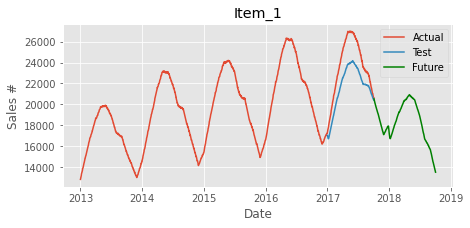

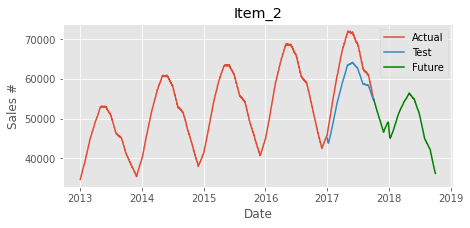

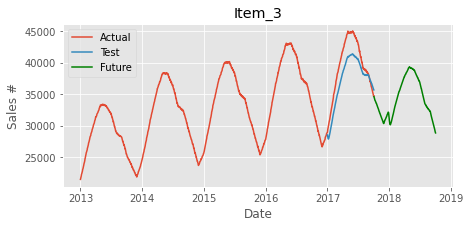

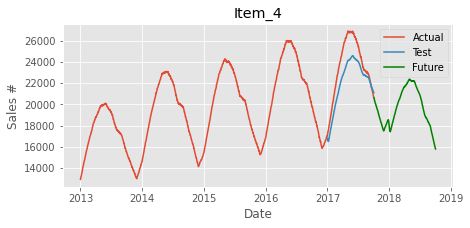

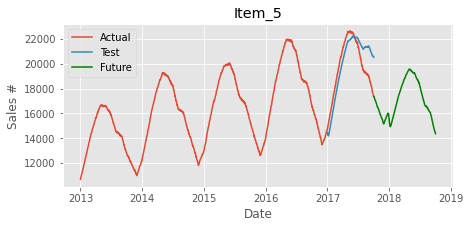

...

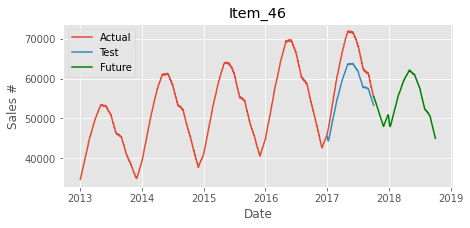

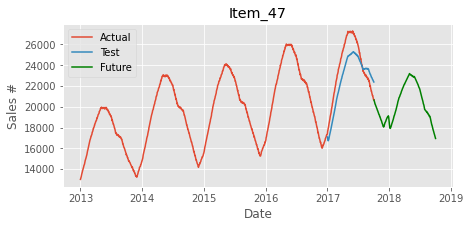

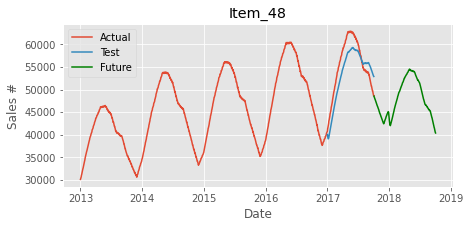

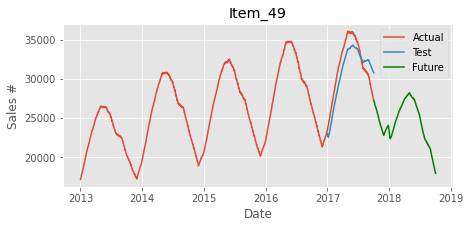

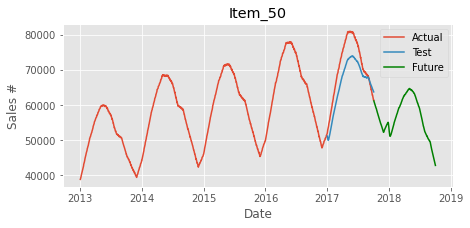

In [ ]:
# list of items in the dataset
item_list = list(df2['item'].unique())

for i in item_list:

  # Filtering the dataset by items
  a = df2[df2['item']==i]
  #print(a)

  # Data Wrangling
  a = a.groupby(['item','date']).agg({'sales':'sum'}).reset_index()
  a = a.set_index('date', drop=True)
  a = a.groupby('item').sales.rolling(90).sum().shift(-90).dropna().reset_index()
  a = a.set_index('date', drop=True)
  a = a.drop('item', axis=1)
  #print(a)
     
  # Splitting the data into training and testing sets
  train = a.loc[:'2016-12-31']
  test = a.loc['2017-01-01':]
    
  # Statistics of dataset
  mean = round(a['sales'].mean(),4)
  stddev = round(a['sales'].std(),4)

  # Holt Winters Model
  
  # Predicting the test dataset values
  hwdf_model_test = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=365).fit()
  
  # We are forecasting only for 275 days as we have lost 90 days from '02/10/2017' as a result of rolling(90) and shift(-90)
  # Passing 365 as the argument for forecasting will result in Value Error as given below
  # 'ValueError: Found input variables with inconsistent numbers of samples: [275, 365]'
  
  hwdf_model_test_pred = hwdf_model_test.forecast(275)
    
  # dictionary for test forecast
  key = 'Item_'+str(i)
  value = hwdf_model_test_pred
  test_forecast_dict2.update({key:value})

  # Evaluation Metrics
  r2 = round(r2_score(test, hwdf_model_test_pred),3).astype(float)
  mse = round(mean_squared_error(test, hwdf_model_test_pred),3).astype(float)
  rmse = round(np.sqrt(mse),3).astype(float)
  mae = round(mean_absolute_error(test, hwdf_model_test_pred),3).astype(float)
  mape = round(mean_absolute_percentage_error(test, hwdf_model_test_pred),3).astype(float)
  
  # dictionary for performance evaluation metrics
  key1 = 'Item_'+str(i)
  value1 = {'r2':r2, 'MSE':mse, 'RMSE':rmse, 'MAE':mae, 'MAPE':mape}
  em_dict_dict2.update({key1:value1})
  
  # Forecasting Future Demand
  hwdf_model_future = ExponentialSmoothing(a, trend='add', seasonal='add', seasonal_periods=365).fit()

  # Forecasting for the next 12 months
  hwdf_model_future_pred = hwdf_model_future.forecast(365)   # Rounding up because demand is expressed better as a whole number
  #print(hwdf_model_future_pred,'\n')

  # dictionary for future forecast
  key = 'Item'+str(i)
  value = hwdf_model_future_pred
  future_forecast_dict2.update({key:value})

  # Visualization
  plt.figure(figsize=(7,3))
  plt.title('Item_'+str(i))
  plt.plot(a, label='Actual')                        # Actual sales
  plt.plot(hwdf_model_test_pred, label='Test')      # test pred
  plt.plot(hwdf_model_future_pred, label='Future', color='green')  # future pred
  plt.xlabel('Date')
  plt.ylabel('Sales #')
  plt.legend(loc='best')
  plt.show()

**The plot has a smaller peak in 2018-19 period (bad forecast) due to the rolling(90), shift(-90), dropna operation. The above operation truncates the dataset beyond 02/10/2017. Hence forecasting the future begins from 02/10/2017. Hence, the poor result. To confirm this hypothesis, uncomment line# 16 and run the code.**

In [ ]:
# dictionary for test forecast

test_forecast_dict2 = pd.DataFrame(test_forecast_dict2)
test_forecast_dict2

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,17050.554544,45078.905194,28526.978726,16813.448194,14460.101677,45506.416599,45272.185149,59726.341434,40633.164036,57253.214757,...,17028.289758,28544.079534,40126.553199,22561.744873,62757.911304,45352.373296,17097.248402,40053.220266,23014.254712,51222.151254
2017-01-02,16932.278818,44709.691275,28311.749644,16686.235250,14352.586941,45144.716943,44903.543982,59339.006158,40341.255816,56808.628132,...,16878.883855,28320.760165,39854.775660,22337.909545,62263.752556,45061.126763,16947.235370,39667.953850,22827.403107,50798.648442
2017-01-03,16875.929719,44466.177353,28159.149084,16612.533356,14279.697663,44934.231706,44682.983278,59073.805982,40171.425481,56512.199439,...,16769.326295,28167.634816,39680.776934,22166.986173,61939.923435,44863.317784,16865.450322,39434.998001,22718.925414,50559.872892
2017-01-04,16777.963463,44158.314840,28011.719330,16536.709492,14206.672049,44650.782276,44341.056096,58674.244326,39939.355335,56191.956216,...,16675.772538,27983.444191,39449.522168,22003.220713,61546.654346,44582.786782,16765.386368,39196.062480,22598.001750,50256.044768
2017-01-05,16734.524496,43975.177602,27923.594438,16505.555351,14192.003189,44519.343703,44172.452149,58484.185229,39858.351103,55978.274578,...,16640.744278,27911.178274,39319.356579,21920.494992,61293.436410,44437.827053,16727.424052,39092.695009,22539.179531,50089.683071
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,20542.552752,55061.928214,35941.077540,21253.591850,20610.284067,56455.300327,55383.173319,76336.892826,52799.413260,74477.143957,...,22002.034313,37483.640698,51012.335736,29439.944158,78359.303301,53794.297991,22509.337538,53220.899350,30974.253701,64274.850380
2017-09-29,20503.470627,54949.504176,35849.747218,21200.155515,20584.738210,56338.794990,55245.890677,76191.386033,52707.173514,74324.286937,...,21944.638498,37391.235835,50883.356359,29380.973472,78209.193062,53674.214836,22484.352441,53113.005568,30931.229296,64139.400864
2017-09-30,20474.774344,54870.425727,35793.315307,21176.338393,20551.904874,56215.453605,55131.172536,76112.448955,52643.976503,74209.424662,...,21897.277097,37322.848035,50820.750163,29337.619186,78093.689075,53538.537645,22441.908010,53013.659846,30880.063081,64063.839265
2017-10-01,20478.108399,54779.419993,35729.387001,21128.671499,20528.165857,56102.258338,55049.899765,75962.736997,52588.047216,74078.739636,...,21874.418639,37257.119387,50728.667033,29310.740065,77985.914283,53460.338004,22437.174290,52959.885952,30839.498778,63971.055595


In [ ]:
# performance evaluation metrics

em_dict_dict2 = pd.DataFrame(em_dict_dict2)
em_dict_dict2

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
r2,0.326,2.140000e-01,0.598,0.555,0.555,5.020000e-01,4.180000e-01,5.300000e-01,6.940000e-01,6.210000e-01,...,0.539,0.657,6.130000e-01,0.607,5.260000e-01,2.660000e-01,0.599,6.700000e-01,0.698,5.480000e-01
MSE,4561323.031,3.689767e+07,7309924.094,3026833.603,1992084.982,2.298421e+07,2.740044e+07,3.764449e+07,1.015465e+07,2.634496e+07,...,3316943.359,5931235.003,1.353000e+07,4634778.367,4.185535e+07,3.500658e+07,2797696.714,1.102405e+07,3520444.428,2.726934e+07
RMSE,2135.725,6.074345e+03,2703.687,1739.780,1411.412,4.794185e+03,5.234543e+03,6.135510e+03,3.186635e+03,5.132735e+03,...,1821.248,2435.413,3.678315e+03,2152.854,6.469571e+03,5.916636e+03,1672.632,3.320249e+03,1876.285,5.222006e+03
MAE,1985.157,5.629683e+03,2413.350,1520.576,1191.930,4.282879e+03,4.791747e+03,5.492957e+03,2.975387e+03,4.646362e+03,...,1624.014,2212.959,3.247140e+03,1925.413,5.820464e+03,5.616727e+03,1536.234,3.091518e+03,1748.358,4.654946e+03
MAPE,0.082,8.800000e-02,0.060,0.063,0.063,6.700000e-02,7.500000e-02,6.500000e-02,5.500000e-02,5.900000e-02,...,0.067,0.056,5.800000e-02,0.061,6.600000e-02,8.700000e-02,0.064,5.600000e-02,0.056,6.400000e-02


In [ ]:
# dictionary for future forecast

future_forecast_dict2 = pd.DataFrame(future_forecast_dict2)
future_forecast_dict2

,Item1,Item2,Item3,Item4,Item5,Item6,Item7,Item8,Item9,Item10,...,Item41,Item42,Item43,Item44,Item45,Item46,Item47,Item48,Item49,Item50
2017-10-03,20528.189271,54738.282501,34597.905305,20595.511189,17342.789992,54651.903011,54914.321577,72572.598510,47764.120547,68851.818745,...,20435.059062,34224.756009,48366.605537,27678.412987,75380.526057,55408.838047,20640.654723,48524.069053,27176.201494,61199.091447
2017-10-04,20454.052404,54578.268809,34474.386213,20541.952919,17287.519597,54521.866879,54768.233612,72301.084643,47629.671526,68650.575542,...,20368.359715,34108.372949,48233.764248,27595.572965,75130.686262,55295.021895,20571.923098,48387.378570,27105.832715,61040.789545
2017-10-05,20393.954156,54437.331500,34391.876268,20471.614838,17235.441682,54412.230237,54610.506688,72156.786881,47518.727907,68499.512433,...,20318.087887,33995.132111,48095.593370,27530.635973,74962.362057,55172.785952,20530.702763,48296.200526,27022.321525,60858.951221
2017-10-06,20334.755449,54281.585345,34299.105440,20397.578387,17194.448800,54296.717726,54479.913909,71988.834668,47436.615400,68328.626362,...,20253.879626,33894.316016,47973.252328,27456.051135,74756.762313,55078.131351,20483.378167,48206.955248,26945.212501,60684.944825
2017-10-07,20267.901577,54155.788141,34196.897232,20344.470245,17162.659252,54111.379404,54353.891515,71813.117167,47310.987408,68097.931424,...,20186.942351,33791.809543,47839.591626,27398.685391,74535.930563,54932.272181,20421.935019,48070.094657,26873.296211,60520.228648
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-09-28,13766.883512,36875.304288,29266.379979,16056.697111,14548.684478,40595.720647,43715.091370,51974.801474,35922.324107,50512.495862,...,14152.954031,23656.725076,38156.783004,20629.416287,54087.270834,45682.646228,17176.896022,40918.100592,18324.961939,43662.643355
2018-09-29,13694.383988,36679.714203,29133.735478,15983.789174,14499.452166,40436.827535,43541.795969,51717.960728,35760.629063,50255.535969,...,14066.403487,23538.083830,37962.235786,20526.931146,53781.567698,45477.787335,17111.592403,40745.978008,18233.027117,43446.938179
2018-09-30,13642.914932,36506.234144,29020.640791,15913.685285,14451.181716,40246.045843,43350.822611,51502.191289,35628.116968,50011.512301,...,13985.395041,23389.654053,37808.435229,20436.484497,53533.300922,45297.617171,17053.657765,40593.931228,18116.404950,43251.417906
2018-10-01,13607.505656,36345.690067,28927.331462,15864.164842,14396.887744,40081.915825,43232.511263,51303.246752,35521.626062,49794.455292,...,13922.063260,23282.821548,37669.662604,20366.326373,53347.877237,45178.348680,17009.578816,40498.586229,18043.685750,43059.938374


In [ ]:
dfr2 = master_data.copy()
dfr2 = dfr2.groupby(['item','date']).agg({'sales':'sum'}).reset_index().set_index('date', drop=True)
dfr2 = dfr2.groupby(['item']).sales.rolling(90).sum().shift(-90).dropna().reset_index()
dfr2 = pd.pivot_table(data=dfr2, index='date', columns='item', values='sales', aggfunc='sum')
dfr2.index.name=None
dfr2.columns.name=None
dfr2_columns_name = ['Item_'+str(i) for i in list(master_data['item'].unique())]
dfr2.columns = dfr2_columns_name

dfr2 = dfr2.loc['2017-01-01':'2017-12-31',:]

In [ ]:
results2 = pd.DataFrame(test_forecast_dict2 - dfr2).dropna()
results2

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,-317.445456,-1026.094806,-498.021274,-314.551806,-288.898323,-868.583401,-951.814851,-1193.658566,-764.835964,-1167.785243,...,-340.710242,-560.920466,-760.446801,-556.255127,-1219.088696,-844.626704,-384.751598,-866.779734,-448.745288,-1001.848746
2017-01-02,-586.721182,-1886.308725,-1002.250356,-601.764750,-531.413059,-1731.283057,-1738.456018,-2236.993842,-1470.744184,-2225.371868,...,-659.116145,-1088.239835,-1469.224340,-1003.090455,-2386.247444,-1567.873237,-729.764630,-1679.046150,-887.596893,-1937.351558
2017-01-03,-698.070281,-2281.822647,-1303.850916,-735.466644,-657.302337,-2071.768294,-2095.016722,-2675.194018,-1770.574519,-2731.800561,...,-822.673705,-1306.365184,-1764.223066,-1214.013827,-2919.076565,-1899.682216,-846.549678,-2049.001999,-1073.074586,-2359.127108
2017-01-04,-867.036537,-2872.685160,-1565.280670,-887.290508,-807.327951,-2560.217724,-2650.943904,-3409.755674,-2141.644665,-3378.043784,...,-1016.227462,-1612.555809,-2152.477832,-1540.779287,-3613.345654,-2347.213218,-1031.613632,-2544.937520,-1312.998250,-2901.955232
2017-01-05,-983.475504,-3292.822398,-1799.405562,-973.444649,-884.996811,-2875.656297,-2995.547851,-3830.814771,-2344.648897,-3831.725422,...,-1125.255722,-1796.821726,-2415.643421,-1703.505008,-4174.563590,-2645.172947,-1140.575948,-2825.304991,-1484.820469,-3225.316929
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,-253.447248,-464.071786,903.077540,361.591850,3095.284067,1062.300327,-206.826681,2739.892826,4479.413260,4585.143957,...,1275.034313,2740.640698,1871.335736,1357.944158,1796.303301,-2326.702009,1617.337538,4098.899350,3377.253701,2074.850380
2017-09-29,-200.529373,-328.495824,936.747218,386.155515,3131.738210,1143.794990,-152.109323,2925.386033,4593.173514,4736.286937,...,1309.638498,2758.235835,1968.356359,1420.973472,2035.193062,-2181.785164,1688.352441,4220.005568,3429.229296,2177.400864
2017-09-30,-167.225656,-149.574273,1030.315307,483.338393,3140.904874,1260.453605,-7.827464,3202.448955,4707.976503,4965.424662,...,1354.277097,2883.848035,2148.750163,1504.619186,2309.689075,-2075.462355,1710.908010,4314.659846,3534.063081,2376.839265
2017-10-01,-99.891601,1.419993,1081.387001,493.671499,3179.165857,1344.258338,64.899765,3293.736997,4777.047216,5131.739636,...,1429.418639,2948.119387,2256.667033,1592.740065,2481.914283,-1974.661996,1789.174290,4372.885952,3577.498778,2579.055595


In [ ]:
# Calculating the difference between the predicted and the actual sales

# Actual sales - Demand
# Predicted sales - Supply

# (predicted sales - actual sales) > 0 = Retenion loss - Multiple by 10
# (predicted sales - actual sales) < 0 = Oppurtunity loss - Multiply by 3

results2 = pd.DataFrame(test_forecast_dict2 - dfr2).dropna()

# Oppurtunity loss and Retention loss
# Oppurtunity loss  - When the demand is high and the supply is lesser than demand
# Retention loss - When the suppy is high and the demand is lesser than supply
# A negative sign in the forecast value

def loss(x):
  if x<0:
    x = x*3
    return x
  else:
    x = x*10
    return x

for i in results.columns:
  results2[i] = np.ceil(results2[i].apply(lambda x: loss(x)))

In [ ]:
results2

,Item_1,Item_2,Item_3,Item_4,Item_5,Item_6,Item_7,Item_8,Item_9,Item_10,...,Item_41,Item_42,Item_43,Item_44,Item_45,Item_46,Item_47,Item_48,Item_49,Item_50
2017-01-01,-952.0,-3078.0,-1494.0,-943.0,-866.0,-2605.0,-2855.0,-3580.0,-2294.0,-3503.0,...,-1022.0,-1682.0,-2281.0,-1668.0,-3657.0,-2533.0,-1154.0,-2600.0,-1346.0,-3005.0
2017-01-02,-1760.0,-5658.0,-3006.0,-1805.0,-1594.0,-5193.0,-5215.0,-6710.0,-4412.0,-6676.0,...,-1977.0,-3264.0,-4407.0,-3009.0,-7158.0,-4703.0,-2189.0,-5037.0,-2662.0,-5812.0
2017-01-03,-2094.0,-6845.0,-3911.0,-2206.0,-1971.0,-6215.0,-6285.0,-8025.0,-5311.0,-8195.0,...,-2468.0,-3919.0,-5292.0,-3642.0,-8757.0,-5699.0,-2539.0,-6147.0,-3219.0,-7077.0
2017-01-04,-2601.0,-8618.0,-4695.0,-2661.0,-2421.0,-7680.0,-7952.0,-10229.0,-6424.0,-10134.0,...,-3048.0,-4837.0,-6457.0,-4622.0,-10840.0,-7041.0,-3094.0,-7634.0,-3938.0,-8705.0
2017-01-05,-2950.0,-9878.0,-5398.0,-2920.0,-2654.0,-8626.0,-8986.0,-11492.0,-7033.0,-11495.0,...,-3375.0,-5390.0,-7246.0,-5110.0,-12523.0,-7935.0,-3421.0,-8475.0,-4454.0,-9675.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-28,-760.0,-1392.0,9031.0,3616.0,30953.0,10624.0,-620.0,27399.0,44795.0,45852.0,...,12751.0,27407.0,18714.0,13580.0,17964.0,-6980.0,16174.0,40989.0,33773.0,20749.0
2017-09-29,-601.0,-985.0,9368.0,3862.0,31318.0,11438.0,-456.0,29254.0,45932.0,47363.0,...,13097.0,27583.0,19684.0,14210.0,20352.0,-6545.0,16884.0,42201.0,34293.0,21775.0
2017-09-30,-501.0,-448.0,10304.0,4834.0,31410.0,12605.0,-23.0,32025.0,47080.0,49655.0,...,13543.0,28839.0,21488.0,15047.0,23097.0,-6226.0,17110.0,43147.0,35341.0,23769.0
2017-10-01,-299.0,15.0,10814.0,4937.0,31792.0,13443.0,649.0,32938.0,47771.0,51318.0,...,14295.0,29482.0,22567.0,15928.0,24820.0,-5923.0,17892.0,43729.0,35775.0,25791.0


## **Model 4 - ARIMA**

In [ ]:
# copying from the master data that we imported in the beginning
ms = master_data.copy()
ms.head()

,item,sales
date,,
2013-01-01,1,13
2013-01-02,1,11
2013-01-03,1,14
2013-01-04,1,13
2013-01-05,1,10


In [ ]:
ms.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 913000 entries, 2013-01-01 to 2017-12-31
Data columns (total 2 columns):
 #   Column  Non-Null Count   Dtype
---  ------  --------------   -----
 0   item    913000 non-null  int64
 1   sales   913000 non-null  int64
dtypes: int64(2)
memory usage: 20.9 MB


In [ ]:
ms.describe()

,item,sales
count,913000.000000,913000.000000
mean,25.500000,52.250287
std,14.430878,28.801144
min,1.000000,0.000000
25%,13.000000,30.000000
50%,25.500000,47.000000
75%,38.000000,70.000000
max,50.000000,231.000000


In [ ]:
ms['item'].value_counts().sort_values(ascending=True)

1     18260
24    18260
3     18260
4     18260
5     18260
6     18260
7     18260
8     18260
9     18260
10    18260
11    18260
12    18260
13    18260
14    18260
15    18260
16    18260
17    18260
18    18260
19    18260
20    18260
21    18260
22    18260
25    18260
26    18260
27    18260
49    18260
38    18260
28    18260
29    18260
30    18260
31    18260
32    18260
33    18260
34    18260
35    18260
36    18260
23    18260
37    18260
2     18260
40    18260
41    18260
42    18260
43    18260
44    18260
45    18260
46    18260
47    18260
48    18260
39    18260
50    18260
Name: item, dtype: int64

In [ ]:
ms.item.nunique()

50

In [ ]:
# every date has 500 entries i.e. 10 products across 50 stores
# there are about 1826 date values i.e. 5 years of data
ms.index.value_counts()

2013-01-01    500
2016-05-11    500
2016-05-09    500
2016-05-08    500
2016-05-07    500
             ... 
2014-08-29    500
2014-08-28    500
2014-08-27    500
2014-08-26    500
2017-12-31    500
Name: date, Length: 1826, dtype: int64

*Due to the complexity in arriving at the the p,d,q values from the acf and pacf plots and the time involved in computing the same through iterations for all 50 items, we are performing ARIMA & SARIMA by taking out a single item for practice purposes*

In [ ]:
ms = ms[ms['item']==1]
ms = ms.drop(['item'], axis=1)

### **Resampling Data**

In [ ]:
# resampling the data by the starting of each month
#ms = ms.reset_index()
#ms['date'] = ms['date'].astype(str)+ms['date'].strftime('%m')
ms = ms.resample('MS').sum().reset_index()

In [ ]:
#ms['date'] = ms['date'].dt.date

In [ ]:
ms = ms.set_index('date', drop=True)
#ms.head()

In [ ]:
ms

,sales
date,
2013-01-01,3794
2013-02-01,3863
2013-03-01,5190
2013-04-01,5783
2013-05-01,6298
2013-06-01,6739
2013-07-01,7107
2013-08-01,6492
2013-09-01,5693


### **Data Visualization**

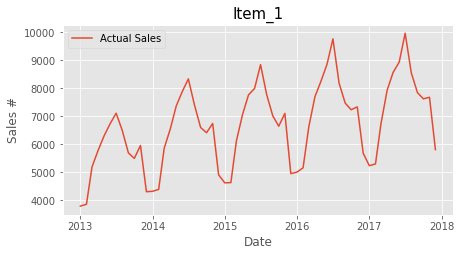

In [ ]:
plt.figure(figsize=(7,3.5))
plt.title('Item_1', size=15)
plt.xlabel('Date', size=12)
plt.ylabel('Sales #', size=12)
plt.plot(ms, label='Actual Sales')
plt.legend()

plt.show()

### **EDA - Decomposing & Rolling Stats**

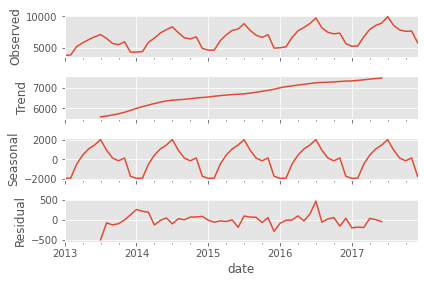

<Figure size 1080x432 with 0 Axes>

In [ ]:
decomposition = seasonal_decompose(ms, model='additive')
decomp_fig = decomposition.plot()
plt.figure(figsize=(15,6))
plt.show()

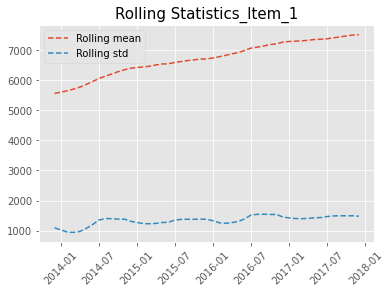

In [ ]:
rm = ms.sales.rolling(12).mean()
rstd = ms.sales.rolling(12).std()
mean = ms.sales.mean()
std = ms.sales.std()
plt.title('Rolling Statistics_Item_1', size=15)
plt.plot(rm, linestyle = '--', label='Rolling mean')
plt.plot(rstd, linestyle = '--', label='Rolling std')
plt.xticks(rotation=45)
plt.legend(loc='best')
plt.show()

### **Check for Stationarity**

#### **Augmented Dickey Fuller Test**

In [ ]:
# check for stationarity

test = adfuller(ms.sales)
output = pd.Series(test[0:4], index=['ADF stat', 'p_value', 'Lags', 'Obs'])

for key,value in test[4].items():
  output['Critical value {}'.format(key)]=value
print(output,'\n')

if output[1] < 0.05:
  print('We reject Ho. The data is stationary')
else:
  print('We fail to reject Ho. The data is non-stationary.')

ADF stat              -4.926312
p_value                0.000031
Lags                  11.000000
Obs                   48.000000
Critical value 1%     -3.574589
Critical value 5%     -2.923954
Critical value 10%    -2.600039
dtype: float64 

We reject Ho. The data is stationary


#### **KPSS**

In [ ]:
kpsstest = kpss(ms.sales, regression='ct')
kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
for key,value in kpsstest[3].items():
  kpss_output['Critical Value (%s)'%key] = value
print(kpss_output,'\n')

if kpss_output[1]<0.05:
  print('We fail to reject Ho. Therefore, the series is stationary')
else:
  print('We reject the Ho. Therefore, the series is non_stationary')

Test Statistic            0.413732
p-value                   0.010000
Lags Used                11.000000
Critical Value (10%)      0.119000
Critical Value (5%)       0.146000
Critical Value (2.5%)     0.176000
Critical Value (1%)       0.216000
dtype: float64 

We fail to reject Ho. Therefore, the series is stationary


#### **Check for strict stationarity**

In [ ]:
# ADF stationary & KPSS stationary
if (output[1] < 0.05) & (kpss_output[1]<0.05):
  print('The series is strictly stationary')
# ADF is non-stationary & KPSS stationary
elif (output[1]>=0.05) & (kpss_output[1]<0.05):
  print('The series is trend stationary')
# ADF is stationary & KPSS non-stationary
elif (output[1]<0.05) & (kpss_output[1]>=0.05):
  print('The series is difference stationary')
# Both are non-stationary
else:
  print('The series is non-stationary')

The series is strictly stationary


### **Train Test Split**

In [ ]:
ms.index.name=None
ms

,sales
2013-01-01,3794
2013-02-01,3863
2013-03-01,5190
2013-04-01,5783
2013-05-01,6298
2013-06-01,6739
2013-07-01,7107
2013-08-01,6492
2013-09-01,5693
2013-10-01,5497


In [ ]:
train = ms.loc[:'2016-12-31']
test = ms.loc['2017-01-01':]

In [ ]:
print(len(ms))
print(len(train))
print(len(test))

60
48
12


In [ ]:
train

,sales
2013-01-01,3794
2013-02-01,3863
2013-03-01,5190
2013-04-01,5783
2013-05-01,6298
2013-06-01,6739
2013-07-01,7107
2013-08-01,6492
2013-09-01,5693
2013-10-01,5497


In [ ]:
test

,sales
2017-01-01,5236
2017-02-01,5299
2017-03-01,6744
2017-04-01,7927
2017-05-01,8561
2017-06-01,8930
2017-07-01,9960
2017-08-01,8548
2017-09-01,7843
2017-10-01,7620


 ### **Hyper Parameter Tuning** - Computing p,d,q. The p,d,q  with the lowest *RMSE* will be chosen

In [ ]:
# defining a range for p, d, q

p = range(0,9)
d = range(0,9)
q = range(0,9)

# creating a list of different combinations of p,d,q
pdq_combination = list(itertools.product(p,d,q))

# creating a list for rmse and order of p,d,q
rmse = []
order = []

for pdq in pdq_combination:
  try:
    model = ARIMA(train, order=pdq).fit()
    prediction = model.predict(start = len(train), end = len(ms)-1)
    rmse_err = np.sqrt(mean_squared_error(test, prediction))
    r2_err = r2_score(test, prediction)
    rmse.append(rmse_err)
    order.append(pdq)
    r2.append(r2_err)
  except:
    continue

results = pd.DataFrame(index = order, columns=['RMSE'], data=rmse)
results.index.name='p d q'

In [ ]:
results_final = pd.DataFrame(results.RMSE.sort_values(ascending=True))
results_final.head()

,RMSE
p d q,
"(7, 0, 1)",1004.168962
"(8, 0, 0)",1060.728376
"(2, 0, 3)",1200.230818
"(7, 0, 0)",1447.399328
"(3, 0, 2)",1502.979458


### **ARIMA model**

In [ ]:
# we choose the p,d,q values with the least RMSE value
model = ARIMA(train, order=(7,0,1)).fit()

### **Forecast - Test data**

In [ ]:
prediction_test = model.predict(start=len(train), end = len(ms)-1)
prediction_test.head()

2017-01-01    5956.890893
2017-02-01    6499.345533
2017-03-01    7119.233830
2017-04-01    6821.764918
2017-05-01    7706.867110
Freq: MS, dtype: float64

### **Performance evaluation metrics**

In [ ]:
mean = ms['sales'].mean()
stddev = ms['sales'].std()
err_mse = mean_squared_error(test, prediction_test)
err_rmse = np.sqrt(err_mse)
err_mae = mean_absolute_error(test, prediction_test)
err_mape = mean_absolute_percentage_error(test, prediction_test)
err_r2 = r2_score(test,prediction_test)

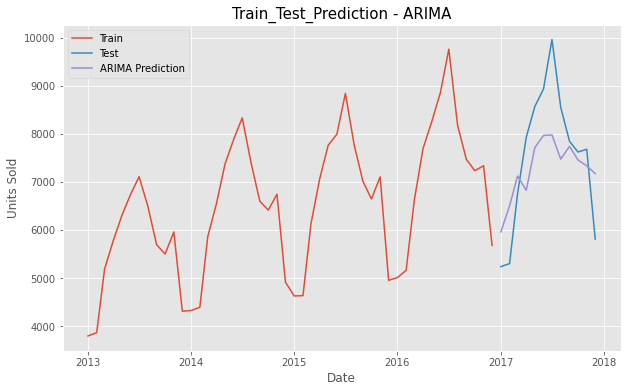

In [ ]:
plt.figure(figsize=(10,6))
plt.plot(train,label='Train')
plt.plot(test, label='Test')
plt.plot(prediction_test, label='ARIMA Prediction')
plt.xlabel('Date', size=12)
plt.ylabel('Units Sold', size=12)
plt.title('Train_Test_Prediction - ARIMA', size=15)
plt.legend()
plt.show()

### **Forecast - Future data**

In [ ]:
final_model_arima = ARIMA(ms, order=(7,0,1)).fit()
pred_future_arima = final_model_arima.predict(start=len(ms), end=len(ms)+11)

In [ ]:
# predicted values of the future without factoring in the Seasonality
pred_future_arima

2018-01-01     7361.309738
2018-02-01     9033.538873
2018-03-01    10518.758518
2018-04-01    10161.816223
2018-05-01    11045.028995
2018-06-01    11316.246097
2018-07-01    10625.038381
2018-08-01     8601.679497
2018-09-01     7630.485446
2018-10-01     7070.080039
2018-11-01     6675.182146
2018-12-01     6327.957446
Freq: MS, dtype: float64

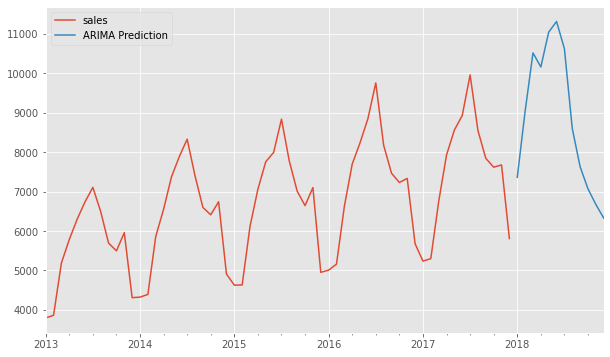

In [ ]:
ms.plot(legend=True, label='Actual Sales', figsize=(10,6))
pred_future_arima.plot(legend=True, label='ARIMA Prediction', figsize=(10,6))
plt.show()

## **Model 5 - SARIMA**

In [ ]:
# defining seasonal order by trial and error. Started with 12 first and arrived at 8

sarima_model = SARIMAX(ms, order=(7,0,1), seasonal_order=(7,0,1,8)).fit()
predict_seasonal_test = sarima_model.predict(start=len(train), end=len(ms)-1)
predict_seasonal_future = sarima_model.predict(start=len(ms), end=len(ms)+11)

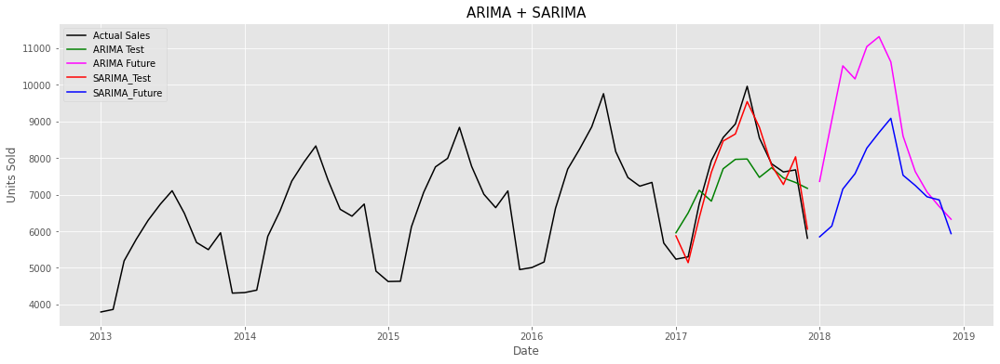

In [ ]:
plt.style.use('ggplot')
plt.figure(figsize=(18,6))
plt.plot(ms, label='Actual Sales', color='black')
plt.plot(prediction_test, label='ARIMA Test', color='green')
plt.plot(pred_future_arima, label='ARIMA Future', color='magenta')
plt.plot(predict_seasonal_test, label='SARIMA_Test', color='red')
plt.plot(predict_seasonal_future, label='SARIMA_Future', color='blue')
plt.title('ARIMA + SARIMA', fontsize=15)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Units Sold', fontsize=12)
plt.legend(loc='best')
plt.show()

# **Model Evaluation**

#### **XG Boosting**

In [ ]:
avg_r2_xgb = em_dict_xgb_df.loc['r2',:].mean()
avg_rmse_xgb = em_dict_xgb_df.loc['RMSE',:].mean()

#### **Decision Tree**

In [ ]:
avg_r2_dt = em_dict_dt_df.loc['r2',:].mean()
avg_rmse_dt = em_dict_dt_df.loc['RMSE', :].mean()

#### **Holt Winter's - Approach 1**

In [ ]:
# calculating the average value of scores for model evaluation

avg_r2_hw_a1 = test_em_dict.loc['r2',:].mean()
avg_rmse_hw_a1 = test_em_dict.loc['RMSE',:].mean()

#### **Holt Winter's - Approach 2**

In [ ]:
avg_r2_hw_a2 = em_dict_dict2.loc['r2',:].mean()
avg_rmse_hw_a2 = em_dict_dict2.loc['RMSE',:].mean()

#### **Autoregressive Integrated Moving Average (ARIMA)**

In [ ]:
err_mse = mean_squared_error(test, prediction_test)
err_rmse = np.sqrt(err_mse)
err_r2 = r2_score(test,prediction_test)

#### **Seasonal ARIMA (SARIMA)**

In [ ]:
err_r2_sarima = r2_score(test, predict_seasonal_test)
err_rmse_sarima = np.sqrt(mean_squared_error(test, predict_seasonal_test))

# **Summary**

In [ ]:
results_dict = {'R2': [avg_r2_hw_a1, avg_r2_hw_a2, err_r2, err_r2_sarima, avg_r2_dt, avg_r2_xgb], 'RMSE':[avg_rmse_hw_a1, avg_rmse_hw_a2, err_rmse, err_rmse_sarima, avg_rmse_dt, avg_rmse_xgb]}
results_dict = pd.DataFrame(results_dict, index=['Holt Winters_App_1', 'Holt Winters_App_2', 'ARIMA','SARIMA', 'DecisionTree', 'XG Boost'])
results_dict = results_dict.sort_values(by=['R2','RMSE'], ascending=[False, True])

In [ ]:
# Rounding off results

def rounding(x):
  a = round(x,2)
  return a
for i in results_dict.columns:
  results_dict[i] = results_dict[i].apply(lambda x: rounding(x))

In [ ]:
# summary of evaluation metrics

results_dict

,R2,RMSE
SARIMA,0.94,333.20
DecisionTree,0.88,2103.21
XG Boost,0.87,2152.67
Holt Winters_App_1,0.82,1133.01
Holt Winters_App_2,0.56,4029.89
ARIMA,0.50,1004.17
